#  __<font color=blue>InferPloidy: Fast and accurate ploidy inference enables inter-tumoral biomarker discovery in single-cell RNA-seq datasets</font>__

- This Jupyter notebook provides codes to reproduce the figures in the above paper.

## __1. Install required packages and import them__

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
!pip install statannot
!pip install statannotations
'''
!pip install scanpy
!pip install scoda-viz==0.4.14
## This jupyter notebook was tested with the above version of scoda-viz package.

In [19]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot
from scodaviz import plot_deg, plot_marker_exp
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population_per_sample, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import find_signif_CNV_gain_regions, find_genes_in_genomic_spots
from scodaviz import plot_cnv_hit, check_cnv_hit, plot_cnv_stat 
from scodaviz import load_scoda_processed_sample_data, get_abbreviations
from scodaviz import compute_sample_div_index, evaluate_performance, split_text

warnings.filterwarnings('ignore')

## __2. Download processed data__

In [2]:
fid_dict = {
    'Breast Cancer': '1xwc0B1TYuhfASSvMhfrMLKbrWgJfsDbe',
    'NSCLC':         '1A86xaiYbyvV1fsW8hJUSC6QxkaVQktuS',
    'PDAC':          '1qa2R3P39kCxtUOxwSCB3K9wrHsuQ6RfZ',
    'CRC':           '1eal16hJkfJWwuvYAgJUDUpCP4grbAHa9'
}

datasets = list(fid_dict.keys())
adata_t = {}
for dataset in datasets:
    adata_t[dataset] = load_scoda_processed_sample_data( fid_dict[dataset], file_type = 'zip' )
    display(adata_t[dataset])

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1xwc0B1TYuhfASSvMhfrMLKbrWgJfsDbe
From (redirected): https://drive.google.com/uc?export=download&id=1xwc0B1TYuhfASSvMhfrMLKbrWgJfsDbe&confirm=t&uuid=15e0027a-dc12-43fd-9f3c-72c0f66382ab
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 347M/347M [00:36<00:00, 9.39MB/s]


AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_score', 'cnv_cluster', 'copykat_pred', 'scevan_pred', 'condition_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_rev', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'sample_ext_for_deg', 'copykat_dec', 'scevan_dec', 'ploidy_dec_scevan', 'ploidy_dec_copykat', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ploidy_init_group'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1A86xaiYbyvV1fsW8hJUSC6QxkaVQktuS
From (redirected): https://drive.google.com/uc?export=download&id=1A86xaiYbyvV1fsW8hJUSC6QxkaVQktuS&confirm=t&uuid=54df8b3d-721f-429f-8156-31fec24d4850
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 347M/347M [00:35<00:00, 9.82MB/s]


AnnData object with n_obs × n_vars = 36374 × 21575
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_annt', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'celltype_minor_org', 'celltype_major_org', 'celltype_subset_org', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'scevan_dec', 'copykat_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ploidy_init_group'
    var: 'gene_symbol', 'mt

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1qa2R3P39kCxtUOxwSCB3K9wrHsuQ6RfZ
From (redirected): https://drive.google.com/uc?export=download&id=1qa2R3P39kCxtUOxwSCB3K9wrHsuQ6RfZ&confirm=t&uuid=7560ec85-35d7-4d9b-82a0-8d82e6f8791d
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 499M/499M [00:50<00:00, 9.95MB/s]


AnnData object with n_obs × n_vars = 46343 × 23898
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'cnv_cluster', 'ploidy_init_group', 'copykat_dec', 'scevan_dec'
    var: 'gene_id', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_scevan', 'gene_to_band_map', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_copykat', 'X_cnv_pca', 'X_cnv_scevan', 'X_cnv_umap', 'X_pca', 'inferploidy_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance', 'cnv_neighbors_connectivities', 'cnv_nei

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1eal16hJkfJWwuvYAgJUDUpCP4grbAHa9
From (redirected): https://drive.google.com/uc?export=download&id=1eal16hJkfJWwuvYAgJUDUpCP4grbAHa9&confirm=t&uuid=a344970c-f0cb-4064-b9d9-41b3885e88f2
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 321M/321M [00:34<00:00, 9.39MB/s]


AnnData object with n_obs × n_vars = 32660 × 22103
    obs: 'Patient', 'Class', 'Source', 'Sample', 'sid', 'Cell_type', 'Cell_subtype', 'Tumor', 'condition', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_init_group'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_id', 'gene_name', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_sceva

## __2B. Or, load your h5ad file__
데이터를 불러오려면 호스팅 된 Colab 서버에 h5ad파일을 직접 업로드하거나 본인 계정의 구글 드라이브를 마운트하여 가져와야 합니다.

In [2]:
fid_dict = {
    'GSE161529 (Breast Cancer)': 'BRCA_GSE161529_33K_scoda_rev_250530_cnv',
    'GSE131907 (NSCLC)':         'NSCLC_GSE131907_36K_scoda_rev_250530_cnv',
    'GSE155698 (PDAC)':          'PDAC_GSE155698_46K_scoda_rev_250531_cnv',
    'GSE132465 (CRC)':           'CRC_GSE132465_Cnt_Norm_32K_scoda_rev_250530_cnv'
}

datasets = list(fid_dict.keys())
adata_t = {}
for dataset in datasets:
    file_h5ad = fid_dict[dataset] + '.h5ad'
    adata_t[dataset] = sc.read_h5ad(file_h5ad)
    display(adata_t[dataset])

AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_score', 'cnv_cluster', 'copykat_pred', 'scevan_pred', 'condition_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_rev', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'sample_ext_for_deg', 'copykat_dec', 'scevan_dec', 'ploidy_dec_scevan', 'ploidy_dec_copykat', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ploidy_init_group'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_

AnnData object with n_obs × n_vars = 36374 × 21575
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_annt', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'celltype_minor_org', 'celltype_major_org', 'celltype_subset_org', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'scevan_dec', 'copykat_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ploidy_init_group'
    var: 'gene_symbol', 'mt

AnnData object with n_obs × n_vars = 46343 × 23898
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'cnv_cluster', 'ploidy_init_group', 'copykat_dec', 'scevan_dec'
    var: 'gene_id', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_scevan', 'gene_to_band_map', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_copykat', 'X_cnv_pca', 'X_cnv_scevan', 'X_cnv_umap', 'X_pca', 'inferploidy_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance', 'cnv_neighbors_connectivities', 'cnv_nei

AnnData object with n_obs × n_vars = 32660 × 22103
    obs: 'Patient', 'Class', 'Source', 'Sample', 'sid', 'Cell_type', 'Cell_subtype', 'Tumor', 'condition', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_init_group'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_id', 'gene_name', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_sceva

## __Figure 2: CNV heatmap__

In [3]:
pfx_dict = {
    'InferCNV+InferPloidy': 'ploidy',
    'Copykat': 'copykat',
    'SCEVAN': 'scevan' } 


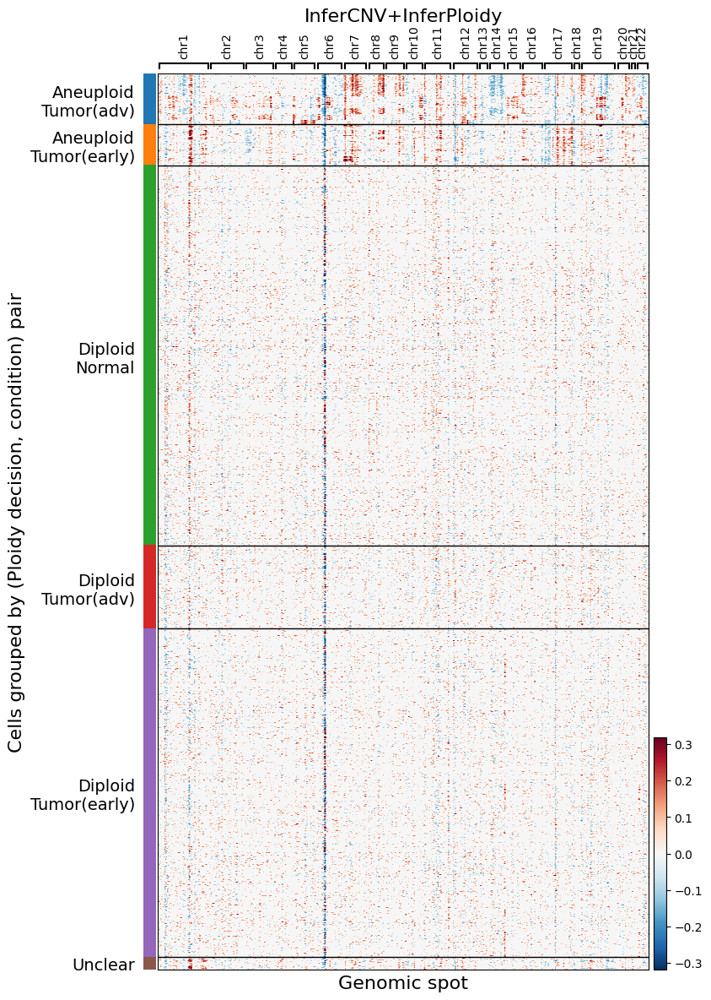

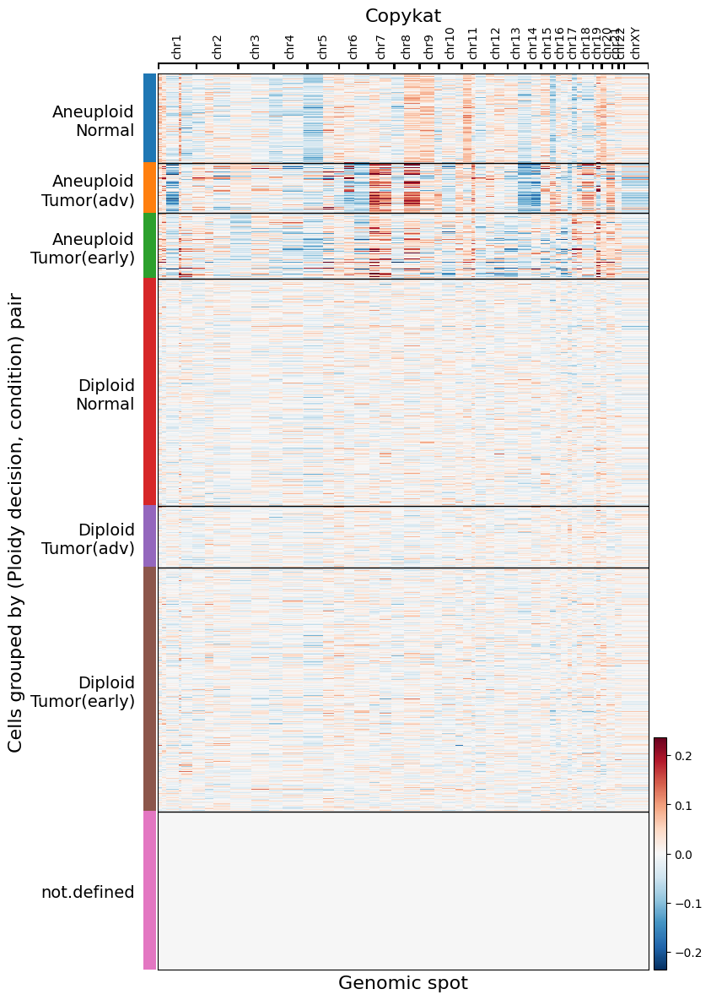

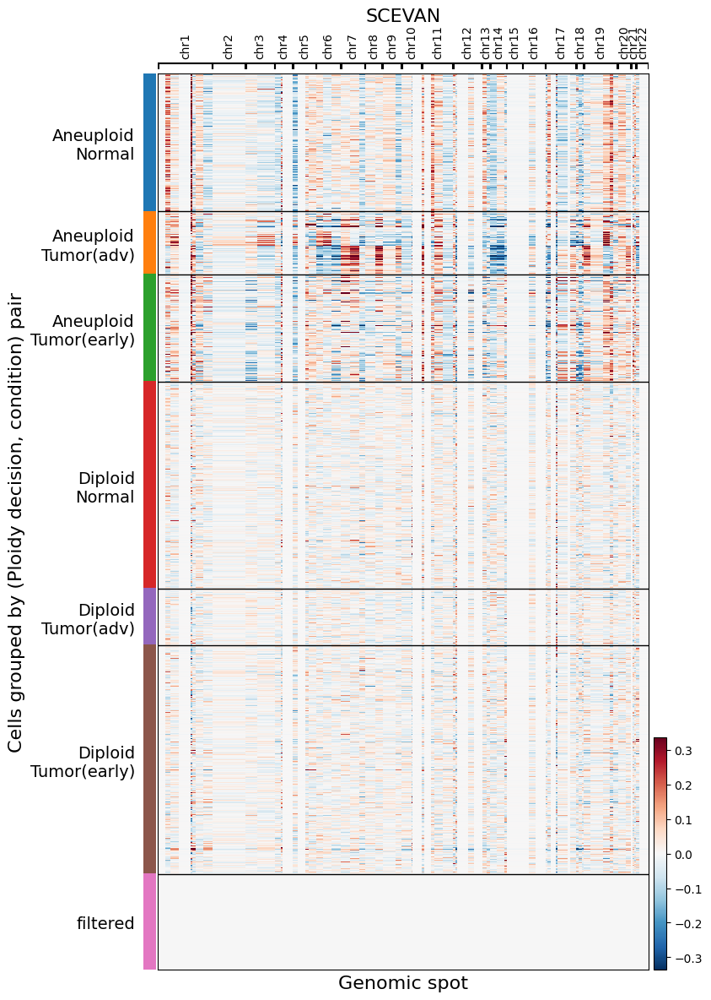

In [4]:
dataset = 'NSCLC'
adata = adata_t[dataset].copy()

for key in pfx_dict.keys():

    ploidy_dec = '%s_dec' % pfx_dict[key]   
    if key == 'InferCNV+InferPloidy':
        ext = ''
    else:
        ext = '_%s' % pfx_dict[key]
    group_col = 'Cells grouped by (Ploidy decision, condition) pair' 
    adata.obs[group_col] = adata.obs[ploidy_dec].astype(str)
    
    b = adata.obs[group_col].isin(['Diploid', 'Aneuploid']) 
    adata.obs.loc[b, group_col] = adata.obs.loc[b, ploidy_dec].astype(str) + '\n' + adata.obs.loc[b, 'condition'].astype(str)
        
    pcnt = adata.obs[group_col].value_counts()
    bp = pcnt >= 0
    b = adata.obs[group_col].isin(list(pcnt.index.values[bp]))
    adata_s = adata[b,:]
    
    ## 'tumor_dec_rev'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
    # sc.settings.set_figure_params(figsize=(7,7), dpi=80, facecolor='white')
    axd = plot_cnv( adata_s, groupby = group_col,
                    title = key, title_fs = 16, title_y_pos = 1.05,
                    label_fs = 16, tick_fs = 14, figsize = (8, 14), swap_axes = False,
                    var_group_rotation = 90, cmap='RdBu_r', vmax = 1, 
                    cnv_obsm_key = 'X_cnv%s' % ext, cnv_uns_key = 'cnv%s' % ext,
                    xlabel = 'Genomic spot', show_ticks = False )

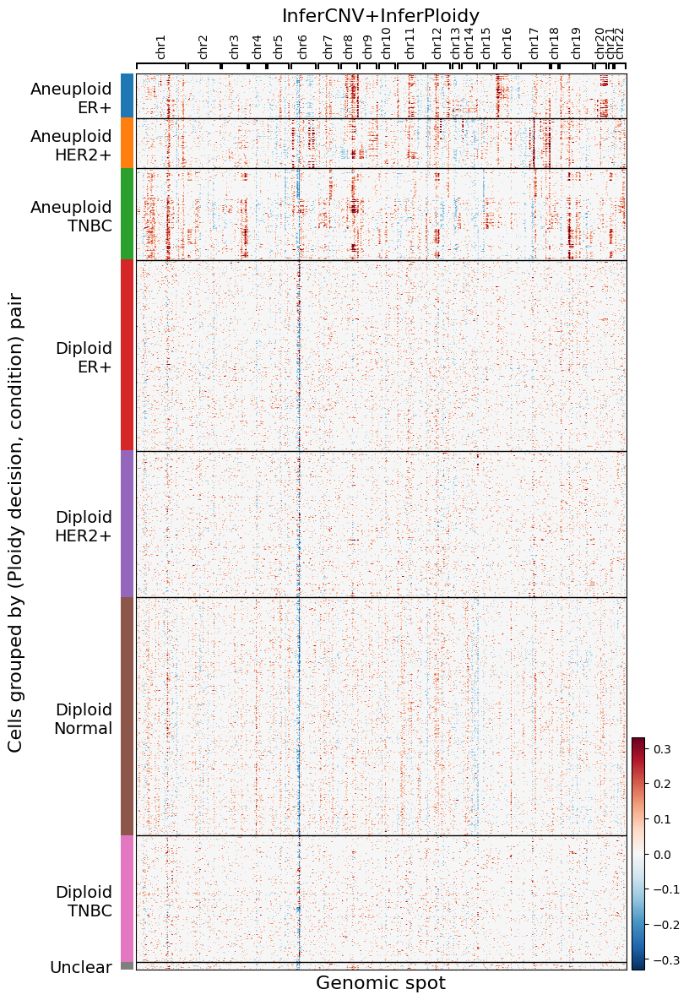

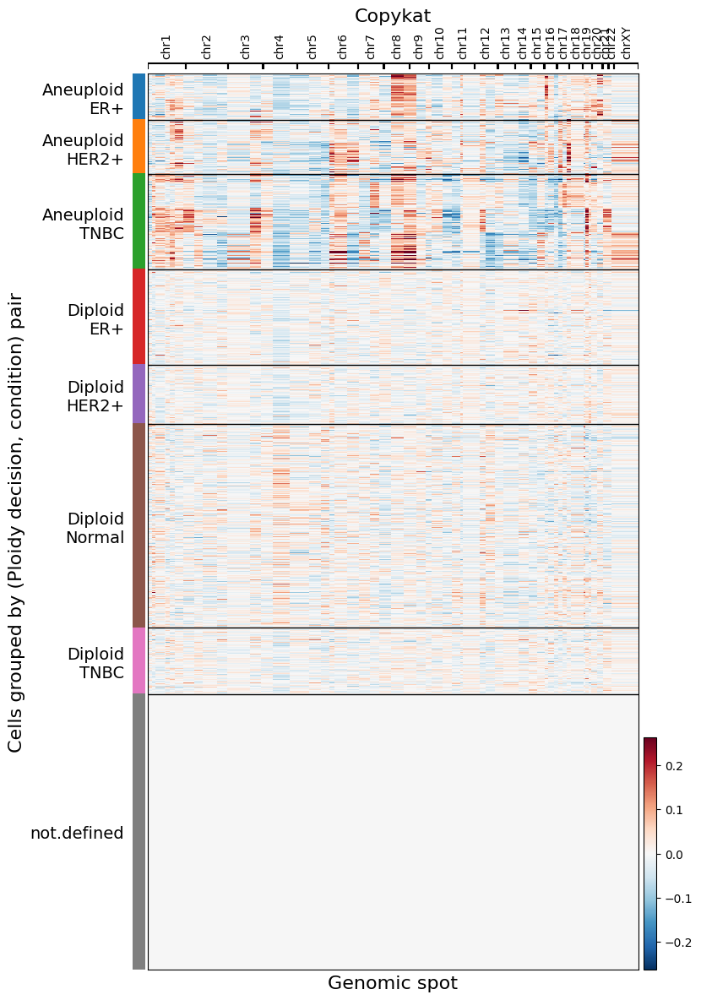

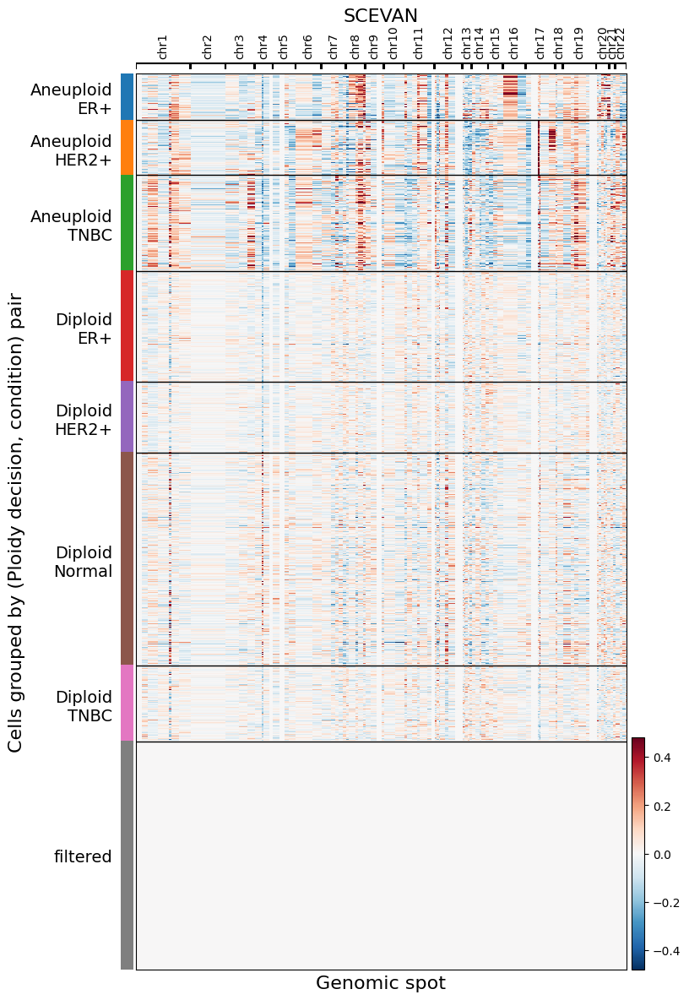

In [5]:
dataset = 'Breast Cancer'
adata = adata_t[dataset].copy()

for key in pfx_dict.keys():

    ploidy_dec = '%s_dec' % pfx_dict[key]   
    if key == 'InferCNV+InferPloidy':
        ext = ''
    else:
        ext = '_%s' % pfx_dict[key]
    group_col = 'Cells grouped by (Ploidy decision, condition) pair' 
    adata.obs[group_col] = adata.obs[ploidy_dec].astype(str)
    
    b = adata.obs[group_col].isin(['Diploid', 'Aneuploid']) 
    adata.obs.loc[b, group_col] = adata.obs.loc[b, ploidy_dec].astype(str) + '\n' + adata.obs.loc[b, 'condition'].astype(str)
        
    pcnt = adata.obs[group_col].value_counts()
    bp = pcnt >= 0
    b = adata.obs[group_col].isin(list(pcnt.index.values[bp]))
    adata_s = adata[b,:]
    
    ## 'tumor_dec_rev'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
    # sc.settings.set_figure_params(figsize=(7,7), dpi=80, facecolor='white')
    axd = plot_cnv( adata_s, groupby = group_col,
                    title = key, title_fs = 16, title_y_pos = 1.05,
                    label_fs = 16, tick_fs = 14, figsize = (8, 14), swap_axes = False,
                    var_group_rotation = 90, cmap='RdBu_r', vmax = 1, 
                    cnv_obsm_key = 'X_cnv%s' % ext, cnv_uns_key = 'cnv%s' % ext,
                    xlabel = 'Genomic spot', show_ticks = False )

## __Figure 3: CNV UMAP__

In [6]:
lst = ['Epithelial cell', 'T cell', 'Smooth muscle cell',
       'Fibroblast', 'Myeloid cell', 'Endothelial cell', 'B cell',
       'Lung Epithelial cell', 'Mast cell', 'Ductal cell' ]
lst2 = ['Epi', 'T cell', 'SMC', 'Fib', 'Myeloid', 'Endo', 'B cell',
        'Lung Epi', 'Mast', 'Duct']

rename_dict = dict(zip(lst, lst2))


In [7]:
dataset = 'NSCLC'
adata = adata_t[dataset]

adata.obs['Major celltype'] = adata.obs['celltype_major'].replace(rename_dict)

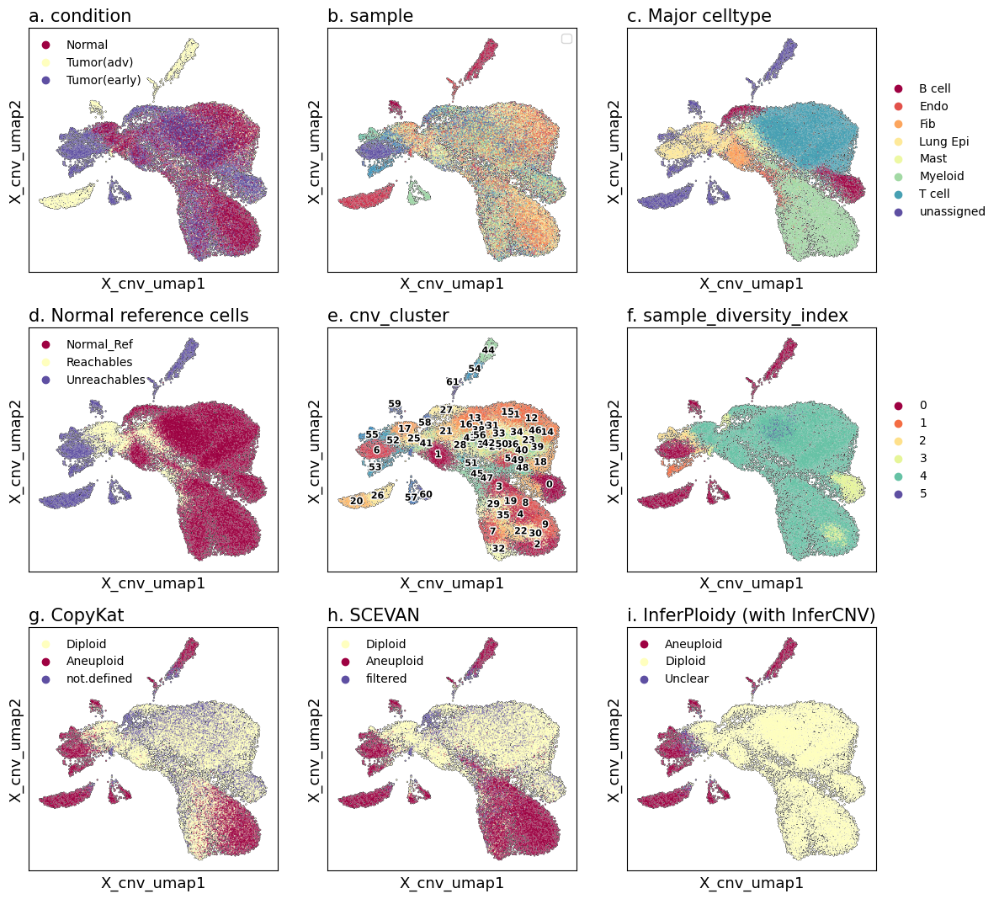

In [8]:
import matplotlib

def get_axes( axes, nr, nc, j ):
    if nr > 1:
        jr = int(np.floor(j/nc))
        jc = j%nc
        ax = axes[jr][jc]
    else:
        ax = axes[j]
    return ax
    
no = 'abcdefghijklmn'
nr = 3
nc = 3
fig, axes = plt.subplots(nr, nc, figsize=(nc*4+1, nr*4+1), dpi = 100)
# fig.suptitle('%s' % ('data'), y = 0.95, fontsize = 14, ha = 'center')

plt.subplots_adjust(wspace = 0.2, hspace = 0.23)

ext = ''
adata.obs['InferPloidy (with InferCNV)'] = adata.obs['ploidy_dec']
adata.obs['InferPloidy (with CopyKat)'] = adata.obs['ploidy_dec%s' % '_copykat']
adata.obs['InferPloidy (with SCEVAN)'] = adata.obs['ploidy_dec%s' % '_scevan']
adata.obs['SCEVAN'] = adata.obs['scevan_dec']
adata.obs['CopyKat'] = adata.obs['copykat_dec']
adata.obs['Normal reference cells'] = adata.obs['ploidy_init_group'] # adata.obs['cnv_ref_ind'].astype(str)
umap_basis = 'X_cnv_umap%s' % ext
neighbors_key = 'cnv_neighbors%s' % ext
cluster_key = 'cnv_cluster%s' % ext
legend_pos = 'upper left'
legend_fs = 10
bbox_to_anchor = (-0.02,1)
title_loc = 'left'
title_fs = 15
label_fs = 13

df_sdi = compute_sample_div_index( adata, sample_col = 'sample',
                                   cluster_col = cluster_key,
                                   tumor_dec = 'ploidy_dec%s' % ext, 
                                   ref_ind_col = 'cnv_ref_ind', 
                                   tumor_name = 'Aneuploid' )

j = 0
ax = get_axes( axes, nr, nc, j )    

item = 'condition'
sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = 'Spectral',
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = bbox_to_anchor, 
          loc = legend_pos)

j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'sample'
sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = 'Spectral',
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend([])

j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'Major celltype'
sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = 'Spectral',
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = (1.,0.5), loc = 'center left')

j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'Normal reference cells'
sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = 'Spectral',
                 # legend_loc="on data", legend_fontoutline=2, legend_fontsize = 9,
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = bbox_to_anchor, loc = legend_pos)

j += 1
ax = get_axes( axes, nr, nc, j )    
item = cluster_key
sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = 'Spectral',
                 legend_loc="on data", legend_fontoutline=2, legend_fontsize = 8,
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = bbox_to_anchor, loc = legend_pos)

j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'sample_diversity_index'
sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, 
                 palette = 'Spectral', 
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = (1.,0.5), 
          loc = 'center left')

j += 1
ax = get_axes( axes, nr, nc, j )    

item = 'CopyKat'
lst = list(adata.obs[item].unique())
lst.sort()
cmap = plt.cm.get_cmap('Spectral', len(lst))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(len(lst))]
pal = dict(zip(lst, colors))

sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = pal, # 'Spectral', 
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = bbox_to_anchor, loc = legend_pos)

j += 1
ax = get_axes( axes, nr, nc, j )  

item = 'SCEVAN'
lst = list(adata.obs[item].unique())
lst.sort()
cmap = plt.cm.get_cmap('Spectral', len(lst))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(len(lst))]
pal = dict(zip(lst, colors))

sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = pal, 
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = bbox_to_anchor, loc = legend_pos)

j += 1
ax = get_axes( axes, nr, nc, j )    

item = 'InferPloidy (with InferCNV)'
lst = list(adata.obs[item].unique())
lst.sort()
cmap = plt.cm.get_cmap('Spectral', len(lst))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(len(lst))]
pal = dict(zip(lst, colors))

sc.pl.embedding( adata, basis = umap_basis, neighbors_key = neighbors_key, 
                 color=item, ax=ax, show=False, palette = pal, 
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = legend_fs, frameon = False, bbox_to_anchor = bbox_to_anchor, loc = legend_pos)


Text(0.0, 1.0, 'o. InferPloidy (with InferCNV)')

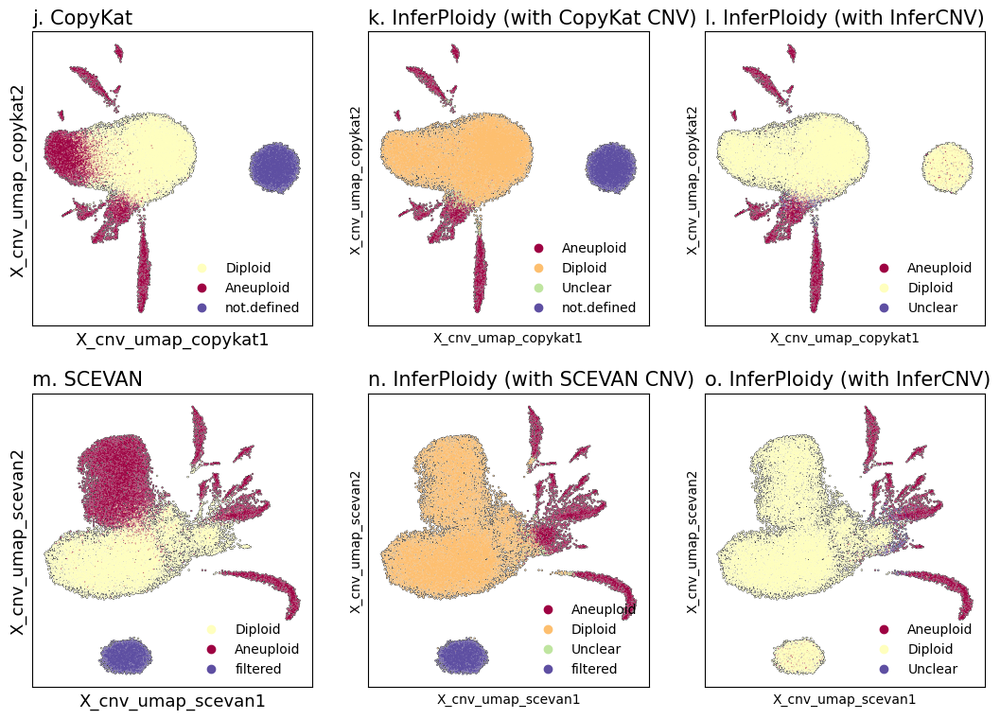

In [9]:
no = 'jklmnopqr'
nr = 2
nc = 3
fig, axes = plt.subplots(nr, nc, figsize=(nc*4+1, nr*4+1), dpi = 100)

plt.subplots_adjust(wspace = 0.2, hspace = 0.23)

adata.obs['InferPloidy (with InferCNV)'] = adata.obs['ploidy_dec']
adata.obs['InferPloidy (with CopyKat CNV)'] = adata.obs['ploidy_dec%s' % '_copykat'].astype(str)
adata.obs['InferPloidy (with SCEVAN CNV)'] = adata.obs['ploidy_dec%s' % '_scevan'].astype(str)
adata.obs['SCEVAN'] = adata.obs['scevan_dec']
adata.obs['CopyKat'] = adata.obs['copykat_dec']
adata.obs['Normal reference indicator'] = adata.obs['ploidy_init_group'] #

b = adata.obs['CopyKat'] == 'not.defined'
adata.obs.loc[b, 'InferPloidy (with CopyKat CNV)'] = 'not.defined'

b = adata.obs['SCEVAN'] == 'filtered'
adata.obs.loc[b, 'InferPloidy (with SCEVAN CNV)'] = 'filtered'

legend_pos = 'lower right'
bbox_to_anchor = (1,0)

umap_basis_copykat = 'X_cnv_umap_copykat'
neighbors_key_copykat = 'cnv_neighbors_copykat'
umap_basis_scevan = 'X_cnv_umap_scevan'
neighbors_key_scevan = 'cnv_neighbors_scevan'

j = 0
ax = get_axes( axes, nr, nc, j )   

item = 'CopyKat'
lst = list(adata.obs[item].unique())
lst.sort()
cmap = plt.cm.get_cmap('Spectral', len(lst))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(len(lst))]
pal = dict(zip(lst, colors))

sc.pl.embedding( adata, basis = umap_basis_copykat, neighbors_key = neighbors_key_copykat, 
                 color=item, ax=ax, show=False, palette = pal, 
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = 10, frameon = False, bbox_to_anchor = bbox_to_anchor, 
          loc = legend_pos)

j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'InferPloidy (with CopyKat CNV)'
sc.pl.embedding( adata, basis = umap_basis_copykat, neighbors_key = neighbors_key_copykat, 
                 color=item, ax=ax, show=False, 
                 palette = 'Spectral', title = '', 
                 add_outline = True )
ax.legend(fontsize = 10, frameon = False, bbox_to_anchor = bbox_to_anchor, 
          loc = legend_pos)
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )

j += 1
ax = get_axes( axes, nr, nc, j )  
item = 'InferPloidy (with InferCNV)'
sc.pl.embedding( adata, basis = umap_basis_copykat, neighbors_key = neighbors_key_copykat, 
                 color=item, ax=ax, show=False, 
                 palette = 'Spectral', title = '', 
                 add_outline = True )
ax.legend(fontsize = 10, frameon = False, bbox_to_anchor = bbox_to_anchor, 
          loc = legend_pos)
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )


j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'SCEVAN'
lst = list(adata.obs[item].unique())
lst.sort()
cmap = plt.cm.get_cmap('Spectral', len(lst))
colors = [matplotlib.colors.to_hex(cmap(i)) for i in range(len(lst))]
pal = dict(zip(lst, colors))

sc.pl.embedding( adata, basis = umap_basis_scevan, neighbors_key = neighbors_key_scevan, 
                 color=item, ax=ax, show=False, palette = pal, 
                 add_outline = True, title = ''  )
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )
ax.yaxis.label.set_size(label_fs)
ax.xaxis.label.set_size(label_fs)
ax.legend(fontsize = 10, frameon = False, bbox_to_anchor = bbox_to_anchor, 
          loc = legend_pos)

#'''
j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'InferPloidy (with SCEVAN CNV)'
sc.pl.embedding( adata, basis = umap_basis_scevan, neighbors_key = neighbors_key_scevan, 
                 color=item, ax=ax, show=False, 
                 palette = 'Spectral', title = '', 
                 add_outline = True )
ax.legend(fontsize = 10, frameon = False, bbox_to_anchor = bbox_to_anchor, 
          loc = legend_pos)
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )

j += 1
ax = get_axes( axes, nr, nc, j )    
item = 'InferPloidy (with InferCNV)'
sc.pl.embedding( adata, basis = umap_basis_scevan, neighbors_key = neighbors_key_scevan, 
                 color=item, ax=ax, show=False, 
                 palette = 'Spectral', title = '', 
                 add_outline = True )
ax.legend(fontsize = 10, frameon = False, bbox_to_anchor = bbox_to_anchor, 
          loc = legend_pos)
ax.set_title('%s. ' % no[j] + item, loc = title_loc, fontsize = title_fs )


## __Load data for performance evaluation__

In [75]:
fid_dict = {
    'Breast Cancer (GSE176078)': '1f8_zvscM0d-m9rlM4X_LrOTZJWBT8w9N',
    'NSCLC (GSE131907)':         '1A86xaiYbyvV1fsW8hJUSC6QxkaVQktuS',
    'HeadNeck (GSE103322)':      '1MGXg-F4j4g-H-KWIdnQPDlJ7wWSlciA6',
    'Melanoma (GSE72056)':       '1I-vbTQypCfj87HTFZvXA9ppcNSqf2KwS'
}

datasets_p = list(fid_dict.keys())
adata_p = {}
for dataset in datasets_p:
    adata_p[dataset] = load_scoda_processed_sample_data( fid_dict[dataset], file_type = 'zip' )
    display(adata_p[dataset])

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1f8_zvscM0d-m9rlM4X_LrOTZJWBT8w9N
From (redirected): https://drive.google.com/uc?export=download&id=1f8_zvscM0d-m9rlM4X_LrOTZJWBT8w9N&confirm=t&uuid=1011745e-42b4-44d4-b962-03feb689a373
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 795M/795M [01:20<00:00, 9.82MB/s]


AnnData object with n_obs × n_vars = 36174 × 23155
    obs: 'Tumor', 'Patient', 'sid', 'Case ID', 'Gender', 'Age', 'Grade', 'Cancer Type', 'ER', 'PR', 'HER2 IHC', 'HER2 ISH (ratio)', 'Ki67', 'Subtype by IHC', 'Treatment status', 'Details of treatment', 'Notable Pathological features', 'Stage', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', 'sample', 'condition', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'scevan_pred', 'copykat_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_scevan', 'ploidy_dec_copykat', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'tot

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1A86xaiYbyvV1fsW8hJUSC6QxkaVQktuS
From (redirected): https://drive.google.com/uc?export=download&id=1A86xaiYbyvV1fsW8hJUSC6QxkaVQktuS&confirm=t&uuid=a377db99-37e1-4244-80c5-2255da1347a7
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 347M/347M [00:36<00:00, 9.44MB/s]


AnnData object with n_obs × n_vars = 36374 × 21575
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_annt', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'celltype_minor_org', 'celltype_major_org', 'celltype_subset_org', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'scevan_dec', 'copykat_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ploidy_init_group'
    var: 'gene_symbol', 'mt

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1MGXg-F4j4g-H-KWIdnQPDlJ7wWSlciA6
From (redirected): https://drive.google.com/uc?export=download&id=1MGXg-F4j4g-H-KWIdnQPDlJ7wWSlciA6&confirm=t&uuid=7518e11f-05d5-409b-9c2d-bdaebe3d7e43
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 150M/150M [00:15<00:00, 9.67MB/s]


AnnData object with n_obs × n_vars = 5902 × 20424
    obs: 'processed by Maxima enzyme', 'Lymph node', 'classified  as cancer cell', 'classified as non-cancer cells', 'non-cancer cell type', 'Tumor', 'cell_type', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'condition', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ss'
    var: 'gene_name', 'variable_genes', 'chr', 'spot_no'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_scevan', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1I-vbTQypCfj87HTFZvXA9ppcNSqf2KwS
From (redirected): https://drive.google.com/uc?export=download&id=1I-vbTQypCfj87HTFZvXA9ppcNSqf2KwS&confirm=t&uuid=3125b5a5-3612-48ef-8535-b2fefdeecbf0
To: /mnt/HDD2/Google_drive/Work_Yoon/Cancer_research/Notebooks/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 123M/123M [00:15<00:00, 7.76MB/s]


AnnData object with n_obs × n_vars = 4645 × 21984
    obs: 'tumor', 'malignant(1=no,2=yes,0=unresolved)', 'non-malignant cell type (1=T,2=B,3=Macro.4=Endo.,5=CAF;6=NK)', 'malignancy', 'cell_type', 'Tumor', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'condition', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan'
    var: 'gene_name', 'variable_genes', 'chr', 'spot_no'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_scevan', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv

In [10]:
fid_dict = {
    'Breast Cancer (GSE176078)': 'BRCA_GSE176078_36K_scoda_rev_250313_cnv',
    'NSCLC (GSE131907)':         'NSCLC_GSE131907_36K_scoda_rev_250530_cnv',
    'HeadNeck (GSE103322)':      'HeadNeck_GSE103322_SMART_seq2_scoda_rev_250313',
    'Melanoma (GSE72056)':       'Melanoma_GSE72056_SMART_seq2_scoda_rev_250313'
}

datasets_p = list(fid_dict.keys())
adata_p = {}
for dataset in datasets_p:
    file_h5ad = fid_dict[dataset] + '.h5ad'
    adata_p[dataset] = sc.read_h5ad(file_h5ad)
    display(adata_p[dataset])

AnnData object with n_obs × n_vars = 36174 × 23155
    obs: 'Tumor', 'Patient', 'sid', 'Case ID', 'Gender', 'Age', 'Grade', 'Cancer Type', 'ER', 'PR', 'HER2 IHC', 'HER2 ISH (ratio)', 'Ki67', 'Subtype by IHC', 'Treatment status', 'Details of treatment', 'Notable Pathological features', 'Stage', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', 'sample', 'condition', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'scevan_pred', 'copykat_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_scevan', 'ploidy_dec_copykat', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'tot

AnnData object with n_obs × n_vars = 36374 × 21575
    obs: 'Barcode', 'Tumor', 'Sample', 'Source', 'Cell_type', 'Cell_type.refined', 'Cell_subtype', 'Patient id', 'Tissue origins', 'Histology', 'Gender', 'Age', 'Smoking', 'Pathology', 'EGFR_annt', 'Stage', 'No. of single-cells', 'Sample id', 'sid', 'celltype', 'celltype_minor_org', 'celltype_major_org', 'celltype_subset_org', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'scevan_dec', 'copykat_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ploidy_init_group'
    var: 'gene_symbol', 'mt

AnnData object with n_obs × n_vars = 5902 × 20424
    obs: 'processed by Maxima enzyme', 'Lymph node', 'classified  as cancer cell', 'classified as non-cancer cells', 'non-cancer cell type', 'Tumor', 'cell_type', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'condition', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan', 'ss'
    var: 'gene_name', 'variable_genes', 'chr', 'spot_no'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_scevan', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X

AnnData object with n_obs × n_vars = 4645 × 21984
    obs: 'tumor', 'malignant(1=no,2=yes,0=unresolved)', 'non-malignant cell type (1=T,2=B,3=Macro.4=Endo.,5=CAF;6=NK)', 'malignancy', 'cell_type', 'Tumor', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'condition', 'copykat_min', 'copykat_wonhee', 'scevan_wonhee', 'copykat_pred', 'scevan_pred', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'copykat_dec', 'scevan_dec', 'ploidy_dec_copykat', 'ploidy_dec_scevan', 'cnv_cluster_copykat', 'cnv_cluster_scevan', 'ploidy_score_copykat', 'ploidy_score_scevan'
    var: 'gene_name', 'variable_genes', 'chr', 'spot_no'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'analysis_parameters', 'cnv', 'cnv_copykat', 'cnv_neighbors_info', 'cnv_scevan', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv

## __Figure 4a. Accuracy & F1 score__

In [11]:
adata_dct = {}
for dataset in datasets_p:
    adata = adata_p[dataset]
    if 'Tumor' in adata.obs.columns.values.tolist():
        adata_dct[dataset] = adata

    if dataset == 'NSCLC':
        b = adata.obs['condition'] != 'Tumor(early)' ## Publisher's annotations not available 
        adata_dct[dataset] = adata[b,:]

Breast Cancer (GSE176078)
NSCLC (GSE131907)
HeadNeck (GSE103322)
Melanoma (GSE72056)


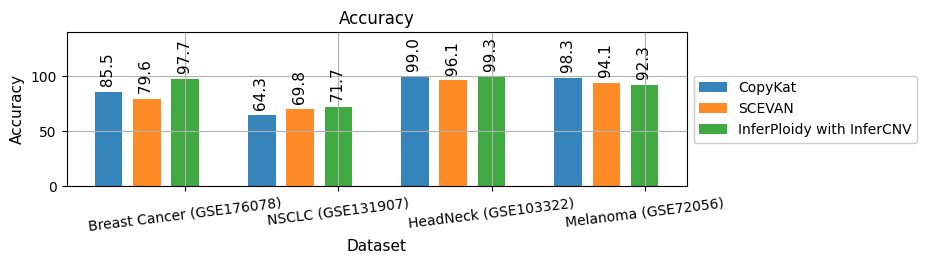

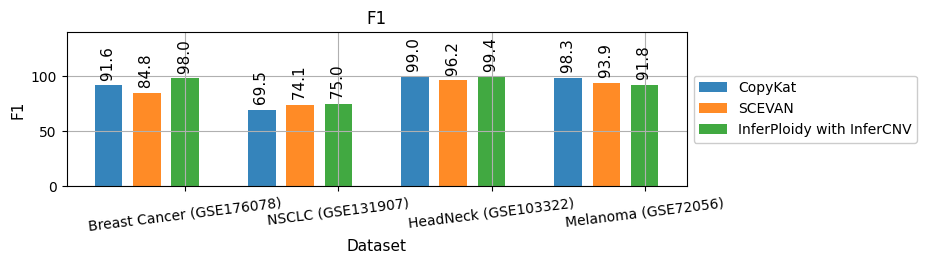

In [12]:
tlst = ['CopyKat', 'SCEVAN', 'InferPloidy with InferCNV'] 
clst = ['copykat_dec', 'scevan_dec', 'ploidy_dec'] 

rend = {'Normal': 'Diploid', 'Tumor': 'Aneuploid'}
df_dct = {}
for k in adata_dct.keys():

    adc = adata_dct[k]
    b1 = ~adc.obs['cnv_ref_ind']
    b2 = adc.obs['Tumor'].isin(['Tumor', 'Normal'])
    b3 = adc.obs['copykat_dec'].isin(['Aneuploid', 'Diploid'])
    b4 = adc.obs['scevan_dec'].isin(['Aneuploid', 'Diploid'])
    b = b2 & b1 # &b3 &b4 
    ad = adc[b,:]

    y = ad.obs['Tumor'].astype(str).replace(rend)
    items = k.split(' ')
    new_key = k # '%s_%s' % (items[0], items[2])
    if items[0] == 'LUAD':
        new_key = new_key + '*'
    print(new_key)
    df = pd.DataFrame(index = tlst)

    for t,c in zip(tlst, clst):
        y_pred = ad.obs[c].astype(str)    
        perf = evaluate_performance(y, y_pred, labels = ['Aneuploid', 'Diploid'] )
        for i in perf.keys():
            df.loc[t, i] = perf[i]

    df_dct[new_key] = df.astype(float)*100
    # display(df)


measure = 'Accuracy'
perf_measures = ['Accuracy', 'F1']

for measure in perf_measures:
    lst = list(df_dct.keys())
    df = pd.DataFrame(index = df_dct[lst[0]].index)
    for j, k in enumerate(lst):
        df[k] = df_dct[k][measure]
        
    df = df.transpose()
    
    # ax = df.plot.bar(width = 0.7, figsize = (8,4), alpha = 0.9)
    
    fig, ax = plt.subplots(figsize=(8, 2))
    
    x = np.arange(len(df)) # - (bar_width + gap)*df.shape[1]
    gap = 0.07
    bar_width = 0.18
    for i, col in enumerate(df.columns):
        ax.bar(x + ((i-1) * (bar_width + gap)), df[col], width=bar_width, label=col, alpha=0.9)
    
    plt.xticks(x + (bar_width + gap), df.index, rotation=10, ha='center', fontsize=11)  # X축 눈금 조정
    
    for i, j in enumerate(list(df.columns.values)):
        label_lst = list(df[j])
        label_lst = [' %3.1f' % a for a in label_lst]
        ax.bar_label(ax.containers[i], labels=label_lst, rotation = 90, fontsize = 11)
    
    plt.ylim([0, 140])
    plt.xticks(rotation = 7, ha = 'center', fontsize = 10)
    plt.legend(loc = 'center left', bbox_to_anchor = (1, 0.5), framealpha=1)
    plt.ylabel(measure, fontsize = 11)
    plt.xlabel('Dataset', fontsize = 11)
    plt.title(measure, fontsize = 12)
    plt.grid()
    plt.show()

## __Figure 4b. Ploidy population__

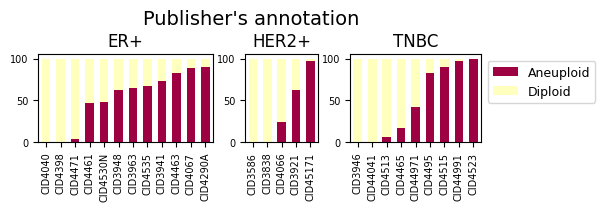

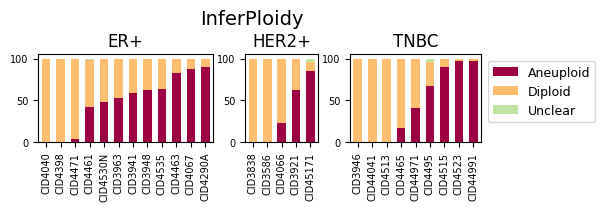

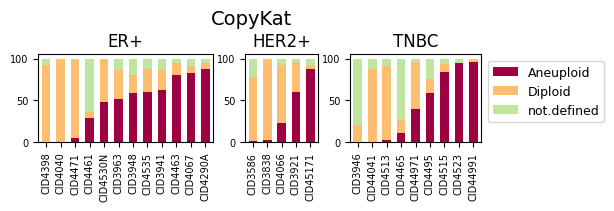

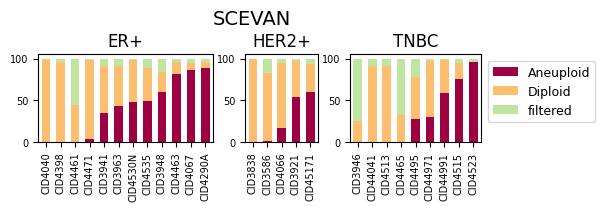

In [13]:
dataset = 'Breast Cancer (GSE176078)'
adata = adata_p[dataset]

b = ~adata.obs['cnv_ref_ind']
adata_s = adata[b,:]

adata_s.obs['Ploidy'] = adata_s.obs['Tumor'].copy(deep = True)
rend = {'Normal': 'Diploid', 'Tumor': 'Aneuploid'}
adata_s.obs['Ploidy'].replace(rend, inplace = True)

lst = ['Ploidy', 'ploidy_dec', 'copykat_dec', 'scevan_dec'] 
tlst = ['Publisher\'s annotation', 'InferPloidy', 'CopyKat', 'SCEVAN'] 

for item, method in zip(lst, tlst):
    celltype_col = item
    df_cnt, df_pct= get_population_per_sample( adata_s, celltype_col, sort_by = [] )
    
    plot_population_grouped( df_pct, sort_by = ['Aneuploid'], bar_width = 0.6,
                     title = method, title_fs = 14, title_y_pos = 1.41, dpi = 100,
                     label_fs = 10, tick_fs = 7, xtick_rot = 90, xtick_ha = 'center',
                     legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                     legend_ncol = 1, cmap = None, figsize=(5, 1), wspace = 0.25, hspace = 0.15)


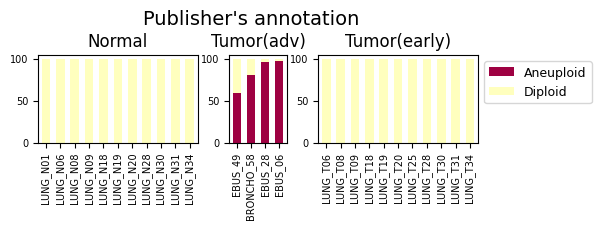

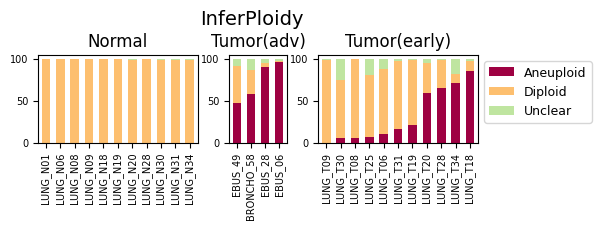

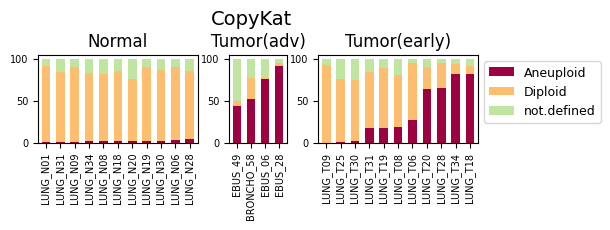

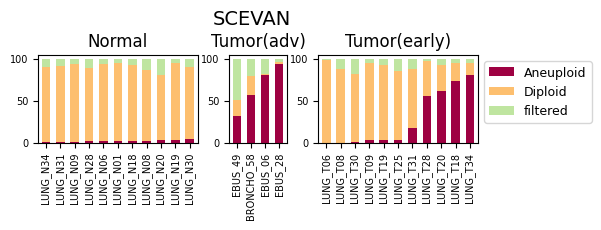

In [14]:
dataset = 'NSCLC (GSE131907)'
adata = adata_p[dataset]

b = ~adata.obs['cnv_ref_ind']
adata_s = adata[b,:]

adata_s.obs['Ploidy'] = adata_s.obs['Tumor'].copy(deep = True)
rend = {'Normal': 'Diploid', 'Tumor': 'Aneuploid'}
adata_s.obs['Ploidy'].replace(rend, inplace = True)

lst = ['Ploidy', 'ploidy_dec', 'copykat_dec', 'scevan_dec'] 
tlst = ['Publisher\'s annotation', 'InferPloidy', 'CopyKat', 'SCEVAN'] 

for item, method in zip(lst, tlst):
    celltype_col = item
    df_cnt, df_pct= get_population_per_sample( adata_s, celltype_col, sort_by = [] )
    
    plot_population_grouped( df_pct, sort_by = ['Aneuploid'], bar_width = 0.6,
                     title = method, title_fs = 14, title_y_pos = 1.41, dpi = 100,
                     label_fs = 10, tick_fs = 7, xtick_rot = 90, xtick_ha = 'center',
                     legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                     legend_ncol = 1, cmap = None, figsize=(5, 1), wspace = 0.25, hspace = 0.15)


## __Figure 5 Marker expression__

In [6]:
datasets

['GSE161529 (Breast Cancer)',
 'GSE131907 (NSCLC)',
 'GSE155698 (PDAC)',
 'GSE132465 (CRC)']

N_markers: 
   Diploid_vs_others (8869 -> 0) 
   ER+_vs_others (10248 -> 23) 
   HER2+_vs_others (10012 -> 12) 
   Normal_vs_others (9883 -> 51) 
   TNBC_vs_others (10729 -> 27)
N_markers_selected: Diploid (0), ER+ (23), HER2+ (12), Normal (40), TNBC (27)
Diploid (0):  []
ER+ (23):  ['BCAM', 'BST2', 'CA12', 'CELSR2', 'ESR1', 'FAM174A', 'GFRA1', 'GPRC5A', 'LDLRAD4', 'MUC1', 'NECTIN2', 'PIGT', 'PRLR', 'PROM2', 'PTPRA', 'SIGIRR', 'SLC39A6', 'SLC44A4', 'SLC49A3', 'SLC7A2', 'SUSD3', 'TMEM25', 'TSPAN1']
HER2+ (12):  ['ADAM10', 'CD164', 'CPD', 'ERBB2', 'ERMP1', 'FAM174B', 'GINM1', 'GPR160', 'HLA-DRA', 'LRP10', 'SCARB2', 'TSPAN5']
Normal (40):  ['ABCC3', 'ADAM9', 'ATP13A3', 'CD44', 'CDCP1', 'CRIM1', 'CXCL16', 'EGFR', 'EMP1', 'EMP3', 'F3', 'FGFR1', 'GLIPR1', 'HBEGF', 'HLA-E', 'IFNGR1', 'IL6R', 'ITGA2', 'ITGA3', 'ITGB6', 'LDLR', 'LTBR', 'MET', 'MFSD12', 'MYOF', 'OSMR', 'PDLIM5', 'PIGR', 'PLAUR', 'PRNP', 'RNF149', 'SLC1A5', 'SLC20A2', 'SLC39A14', 'SLC3A2', 'SLC7A1', 'SLC7A5', 'TMEM30A', 'TNFRSF1A

... storing 'sample_ext_for_deg' as categorical


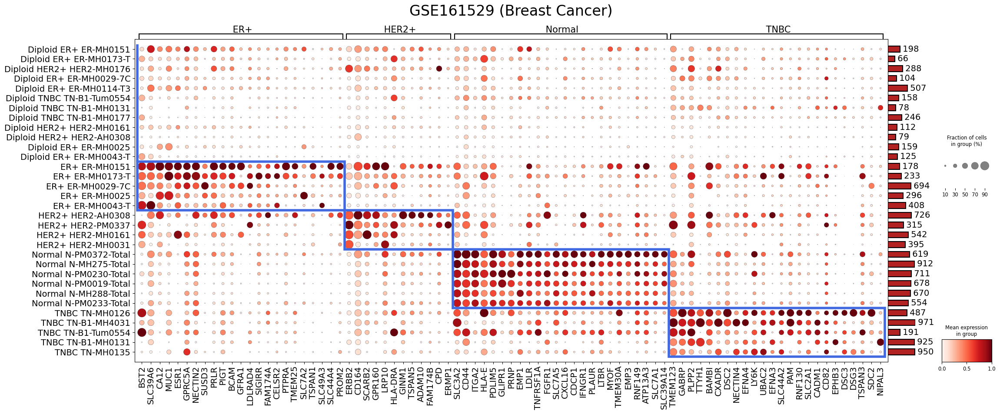

N_markers: 
   Diploid_vs_others (9131 -> 0) 
   Normal_vs_others (9505 -> 18) 
   Tumor(adv)_vs_others (11449 -> 17) 
   Tumor(early)_vs_others (11364 -> 79)
N_markers_selected: Diploid (0), Normal (18), Tumor(adv) (17), Tumor(early) (40)
Diploid (0):  []
Normal (18):  ['ABCA3', 'ALPL', 'AQP4', 'CADM1', 'CD302', 'CD36', 'CD52', 'CLDN18', 'CPM', 'DUOX1', 'FLRT3', 'FOLR1', 'LAMP3', 'MFSD2A', 'PIGR', 'SLC39A8', 'SUSD2', 'VSIG2']
Tumor(adv) (17):  ['ADAM10', 'ADAM9', 'ADGRG1', 'CDCP1', 'DAG1', 'DSC2', 'GPC1', 'HYAL2', 'IL20RB', 'LY6D', 'LYPD3', 'MYADM', 'PROM2', 'SLC39A10', 'SLC6A8', 'TM7SF3', 'VSIG10']
Tumor(early) (40):  ['ABCC3', 'ADGRF1', 'AMIGO2', 'APP', 'AREG', 'BCAM', 'BST2', 'CD82', 'CEACAM5', 'EGFR', 'EPHA2', 'ERBB2', 'F11R', 'GPC4', 'GPR160', 'GPRC5C', 'ICAM1', 'IFNAR1', 'IFNAR2', 'IL10RB', 'ITGA2', 'ITGA3', 'LRP10', 'MET', 'MPZL2', 'OSMR', 'PIGT', 'PLPP2', 'PLXNB2', 'PMEPA1', 'QSOX1', 'SEZ6L2', 'SLC12A2', 'SLC43A3', 'STEAP4', 'TM4SF1', 'TMEM30A', 'TNFRSF21', 'TSPAN15', 'TSPAN6'

... storing 'sample_ext_for_deg' as categorical


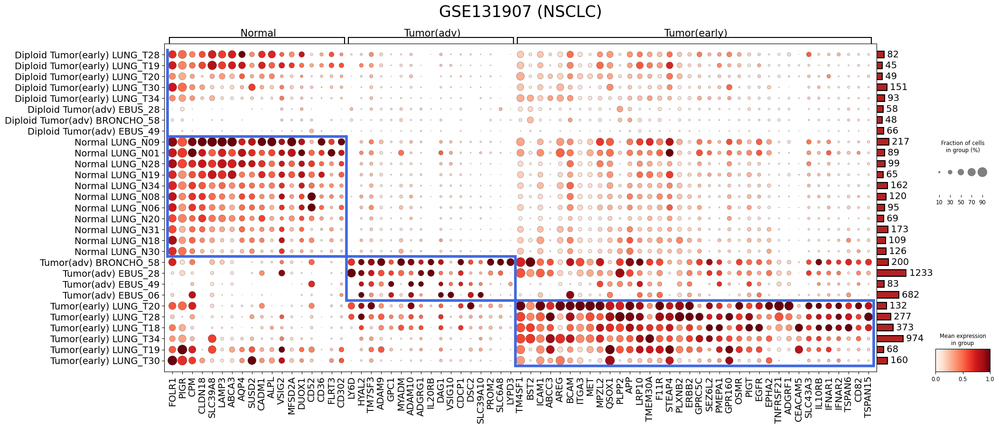

N_markers: 
   Adj_normal_vs_others (10868 -> 11) 
   Diploid_vs_others (10496 -> 0) 
   PDAC_vs_others (12461 -> 347)
N_markers_selected: Adj_normal (11), Diploid (0), PDAC (40)
Adj_normal (11):  ['ADRA2A', 'AQP1', 'CLDN3', 'FGFR3', 'GP2', 'GYPC', 'SCTR', 'SDC2', 'SGCE', 'SLC3A1', 'SLC4A4']
Diploid (0):  []
PDAC (40):  ['ADAM9', 'AMN', 'CD82', 'CDCP1', 'CDH1', 'CLSTN1', 'CXCL16', 'DSG2', 'EMP1', 'EMP2', 'ERBB3', 'F11R', 'GPRC5A', 'ITGA2', 'ITGA3', 'ITGA6', 'MET', 'MSLN', 'MYOF', 'PCDH1', 'PDLIM5', 'PLAUR', 'PRSS8', 'QSOX1', 'RNF149', 'RPN1', 'SDC1', 'SERINC2', 'SERINC3', 'SLC2A1', 'SLC44A4', 'TFPI', 'TM9SF2', 'TM9SF3', 'TMCO3', 'TMEM87B', 'TSPAN1', 'TSPAN15', 'UNC93B1', 'VSIG2']
Num markers selected: 35 -> 35


... storing 'sample_ext_for_deg' as categorical


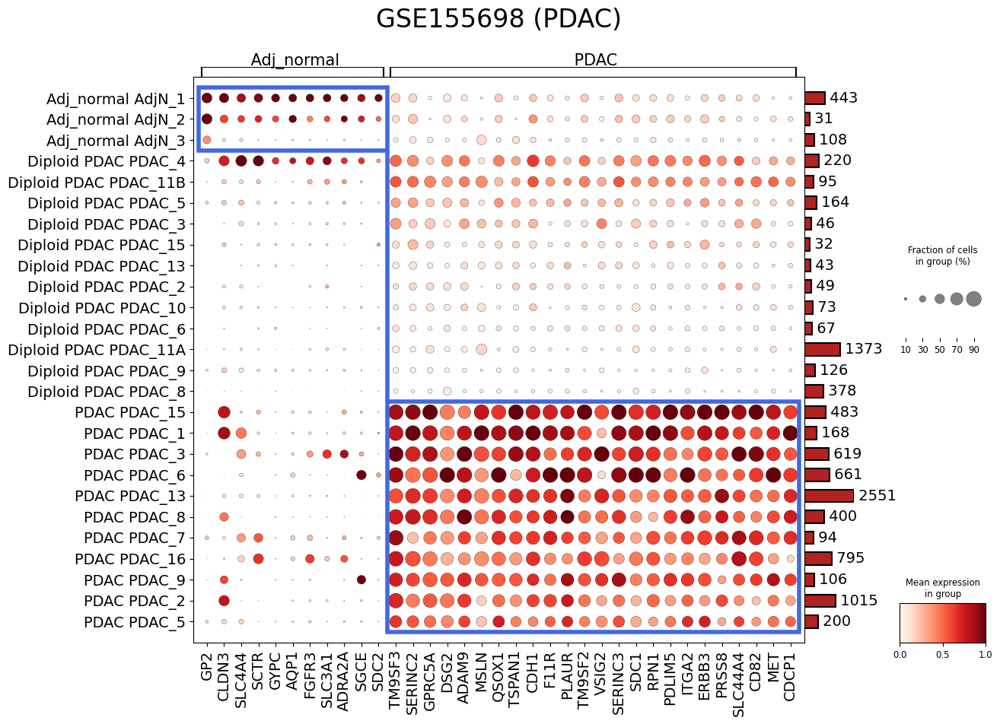

N_markers: 
   Adj_normal_vs_others (9426 -> 9) 
   Diploid_vs_others (9350 -> 0) 
   Tumor_vs_others (11397 -> 267)
N_markers_selected: Adj_normal (9), Diploid (0), Tumor (40)
Adj_normal (9):  ['BEST4', 'CA12', 'CA4', 'CDHR5', 'CEACAM7', 'LYPD8', 'MUC4', 'PIGR', 'VSIG2']
Diploid (0):  []
Tumor (40):  ['ATP1B3', 'ATRAID', 'CD320', 'CDH1', 'CEACAM6', 'CHPT1', 'CXADR', 'DDR1', 'EBP', 'EPHA2', 'ERBB3', 'EREG', 'F11R', 'HM13', 'ITGA6', 'LDLR', 'LY6E', 'MPZL1', 'MUC3A', 'PIGT', 'PLPP2', 'PMEPA1', 'RNF149', 'SDC1', 'SERINC3', 'SERINC5', 'SLC12A2', 'SLC2A1', 'SLC38A1', 'SLC52A2', 'SSR1', 'STT3B', 'SYPL1', 'TGOLN2', 'TM4SF1', 'TM9SF2', 'TM9SF3', 'TNFRSF21', 'TSPAN6', 'UBAC2']
Num markers selected: 33 -> 33


... storing 'sample_ext_for_deg' as categorical


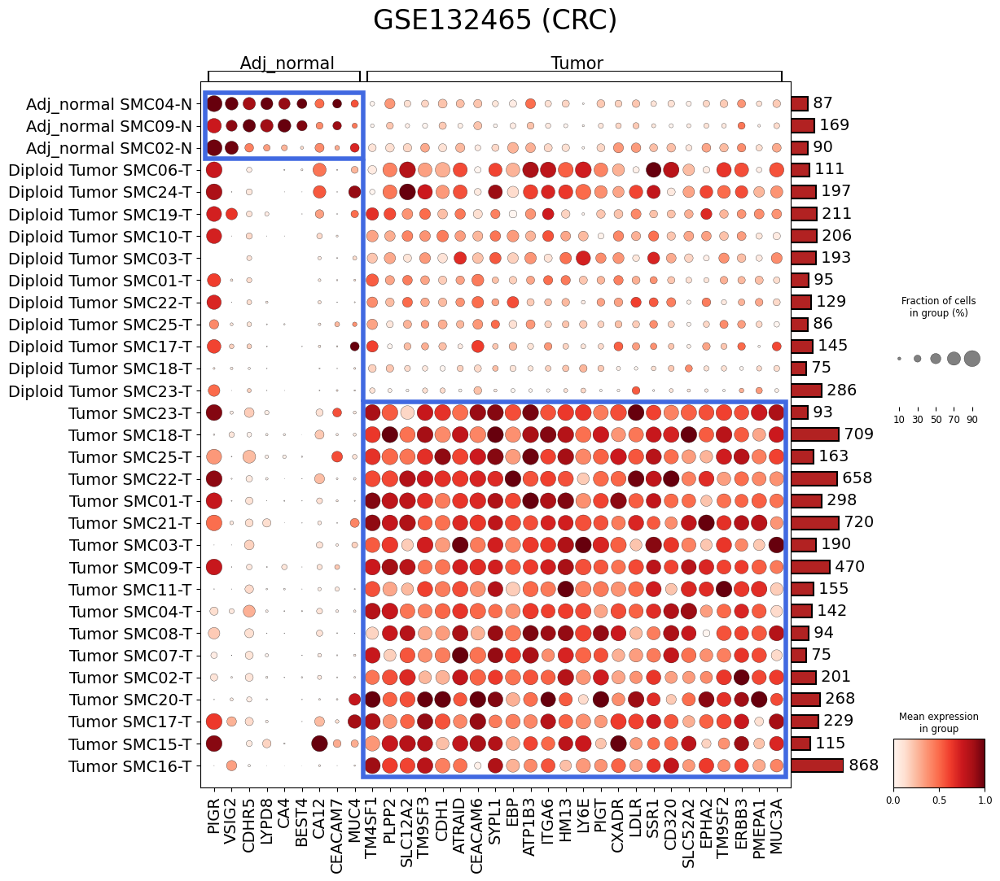

In [22]:
N_markers_max = 40
for dataset in datasets:

    adata = adata_t[dataset]
    nc_deg_dct_of_dct = adata.uns['DEG_stat']
    df_deg_dct_of_dct = adata.uns['DEG']

    if 'PDAC' in dataset:
        target_cell = 'Ductal cell'
        N_mkrs = 24
        N_cells_min = 30
        fs = (13,5)
    elif 'NSCLC' in dataset:
        target_cell = 'Lung Epithelial cell'
        N_mkrs = 36
        N_cells_min = 40
        fs = (22,5)
    elif 'CRC' in dataset:
        target_cell = 'Epithelial cell'
        N_mkrs = 24
        N_cells_min = 70
        fs = (12,5)
    else:
        target_cell = 'Epithelial cell'
        N_mkrs = 24
        N_cells_min = 40
        fs = (25,5)
    
    df_deg_lst = df_deg_dct_of_dct[target_cell]
    
    mkr_dict, df_deg_dct_updated = find_condition_specific_markers( df_deg_lst,
                                                score_col = 'nz_pct_score',
                                                n_markers_max = N_markers_max,
                                                score_cutoff = 0.25,
                                                pval_cutoff = 0.05,
                                                nz_pct_fc_cutoff = 1.25,
                                                surfaceome_only = True,
                                                verbose = True )
    
    ## Print results
    for key in mkr_dict.keys():
        mkr_dict[key].sort()
        print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])
    
    
    title = dataset    
    plot_marker_exp(adata, markers = mkr_dict, celltype_selection = 'Tumor cell',
                    N_cells_per_group_min = N_cells_min, N_markers_per_group_max = N_mkrs, N_markers_total = 140,
                    title = title, title_y_pos = 2, title_fs = 24, text_fs = 14,
                    var_group_height = 1.2, var_group_rotation = 0,
                    standard_scale = 'var', nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                    rem_mkrs_common_in_N_groups_or_more = 3, legend = True,
                    figsize = fs, swap_ax = False, add_rect = True,
                    cmap = 'Reds', linewidth = 4, linecolor = 'royalblue' )

## __Figure 6 Venn diagram__

In [3]:
datasets

['GSE161529 (Breast Cancer)',
 'GSE131907 (NSCLC)',
 'GSE155698 (PDAC)',
 'GSE132465 (CRC)']

In [65]:
target_labels = ['TNBC', 'NSCLC', 'PDAC', 'CRC']
target_cancers = ['TNBC', 'Tumor(early)', 'PDAC', 'Tumor']
tumor_origins = ['Epithelial cell', 'Lung Epithelial cell', 'Ductal cell', 'Epithelial cell']
tumor_markers = {}
N_markers_max = 40

for j, dataset in enumerate(datasets):

    adata = adata_t[dataset]

    cancer_type = dataset
    nc_deg_dct = adata.uns['DEG_stat']
    df_deg_dct = adata.uns['DEG']
    
    target_cell = tumor_origins[j] # 'Epithelial cell'
    
    df_deg_lst = df_deg_dct[target_cell]
    
    mkr_dict, df_deg_dct_updated = find_condition_specific_markers( df_deg_lst,
                                                score_col = 'nz_pct_score',
                                                n_markers_max = N_markers_max,
                                                score_cutoff = 0.25,
                                                pval_cutoff = 0.05,
                                                nz_pct_fc_cutoff = 1.25,
                                                surfaceome_only = True,
                                                verbose = True )

    tumor_markers[target_labels[j]] = mkr_dict[target_cancers[j]]
    display(mkr_dict.keys())

## Print results
for key in tumor_markers.keys():
    tumor_markers[key].sort()
    print('%s (%i): ' % (key, len(tumor_markers[key])), tumor_markers[key])

https://github.com/combio-dku
N_markers: 
   Diploid_vs_others (8869 -> 0) 
   ER+_vs_others (10248 -> 23) 
   HER2+_vs_others (10012 -> 12) 
   Normal_vs_others (9883 -> 51) 
   TNBC_vs_others (10729 -> 27)
N_markers_selected: Diploid (0), ER+ (23), HER2+ (12), Normal (40), TNBC (27)


dict_keys(['Diploid', 'ER+', 'HER2+', 'Normal', 'TNBC'])

N_markers: 
   Diploid_vs_others (9131 -> 0) 
   Normal_vs_others (9505 -> 18) 
   Tumor(adv)_vs_others (11449 -> 17) 
   Tumor(early)_vs_others (11364 -> 79)
N_markers_selected: Diploid (0), Normal (18), Tumor(adv) (17), Tumor(early) (40)


dict_keys(['Diploid', 'Normal', 'Tumor(adv)', 'Tumor(early)'])

N_markers: 
   Adj_normal_vs_others (10868 -> 11) 
   Diploid_vs_others (10496 -> 0) 
   PDAC_vs_others (12461 -> 347)
N_markers_selected: Adj_normal (11), Diploid (0), PDAC (40)


dict_keys(['Adj_normal', 'Diploid', 'PDAC'])

N_markers: 
   Adj_normal_vs_others (9426 -> 9) 
   Diploid_vs_others (9350 -> 0) 
   Tumor_vs_others (11397 -> 267)
N_markers_selected: Adj_normal (9), Diploid (0), Tumor (40)


dict_keys(['Adj_normal', 'Diploid', 'Tumor'])

TNBC (27):  ['BAMBI', 'CADM1', 'CD82', 'CXADR', 'DSC2', 'DSC3', 'DSG3', 'EFNA3', 'EFNA4', 'EPHB3', 'GABRP', 'GPNMB', 'ITM2C', 'LY6K', 'NECTIN4', 'NIPAL3', 'PAM', 'PLPP2', 'PTK7', 'RNF130', 'SDC2', 'SLC2A1', 'SLC44A2', 'TMEM123', 'TSPAN3', 'TTYH1', 'UBAC2']
NSCLC (40):  ['ABCC3', 'ADGRF1', 'AMIGO2', 'APP', 'AREG', 'BCAM', 'BST2', 'CD82', 'CEACAM5', 'EGFR', 'EPHA2', 'ERBB2', 'F11R', 'GPC4', 'GPR160', 'GPRC5C', 'ICAM1', 'IFNAR1', 'IFNAR2', 'IL10RB', 'ITGA2', 'ITGA3', 'LRP10', 'MET', 'MPZL2', 'OSMR', 'PIGT', 'PLPP2', 'PLXNB2', 'PMEPA1', 'QSOX1', 'SEZ6L2', 'SLC12A2', 'SLC43A3', 'STEAP4', 'TM4SF1', 'TMEM30A', 'TNFRSF21', 'TSPAN15', 'TSPAN6']
PDAC (40):  ['ADAM9', 'AMN', 'CD82', 'CDCP1', 'CDH1', 'CLSTN1', 'CXCL16', 'DSG2', 'EMP1', 'EMP2', 'ERBB3', 'F11R', 'GPRC5A', 'ITGA2', 'ITGA3', 'ITGA6', 'MET', 'MSLN', 'MYOF', 'PCDH1', 'PDLIM5', 'PLAUR', 'PRSS8', 'QSOX1', 'RNF149', 'RPN1', 'SDC1', 'SERINC2', 'SERINC3', 'SLC2A1', 'SLC44A4', 'TFPI', 'TM9SF2', 'TM9SF3', 'TMCO3', 'TMEM87B', 'TSPAN1', 'TSPAN15

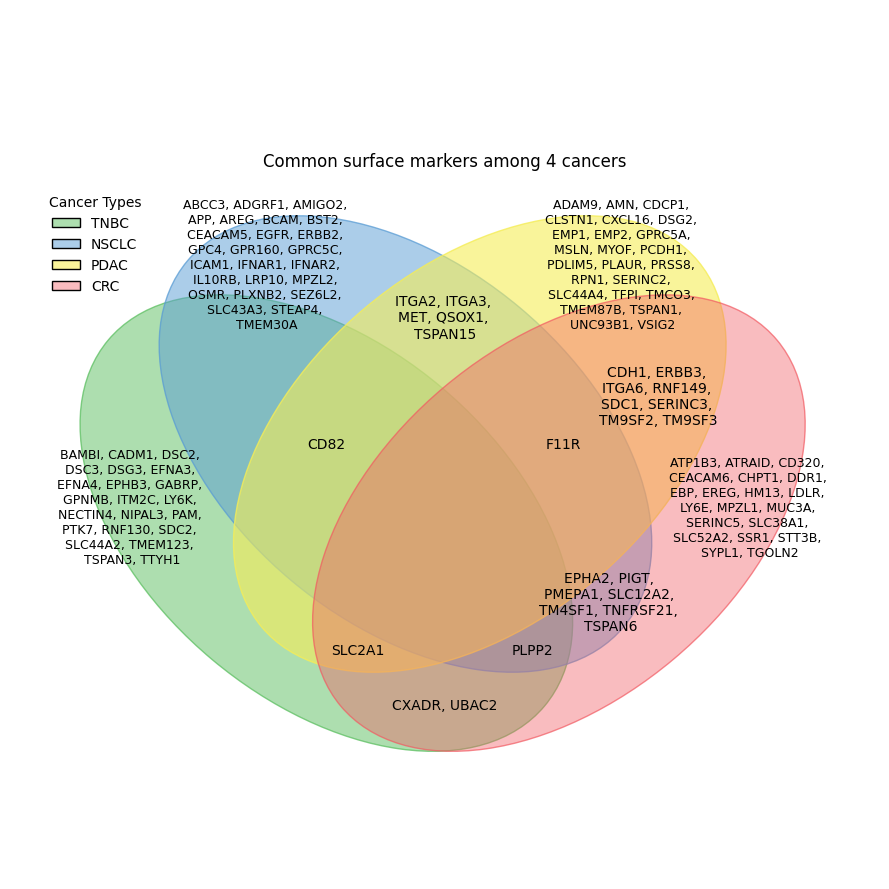

In [66]:
import sys
import matplotlib.pyplot as plt
from itertools import product
from matplotlib.patches import Patch

sys.path.insert(0, '.../pyvenn')  # 실제 경로로 바꿔야 합니다.
import venn

keys = list(tumor_markers.keys())
vals = list(tumor_markers.values())
vals = [set(v) for v in vals]

label_dict = venn.get_labels(vals, fill=['logic'])
logic_keys = list(label_dict.keys()) 

label_elements = {}
for comb in product('01', repeat=4):
    key = ''.join(comb)
    idx = [i for i, val in enumerate(key) if val == '1']
    if not idx:
        continue
    intersect = vals[idx[0]].copy()
    for i in idx[1:]:
        intersect &= vals[i]
    for j in range(len(vals)):
        if j not in idx:
            intersect -= vals[j]
    if intersect:
        if key in ['0001', '0010', '0100', '1000']:
            label_elements[key] = split_text( ', '.join(sorted(intersect)), N_max = 22 )
        else:
            label_elements[key] = split_text( ', '.join(sorted(intersect)), N_max = 17 )

fig, ax = venn.venn4(label_dict, names=keys)

for text_obj, logic_key in zip(ax.texts, logic_keys):
    if logic_key in label_elements:
        txt = label_elements[logic_key]
        text_obj.set_text(txt)
        if logic_key in ['0001', '0010', '0100', '1000']:
            text_obj.set_fontsize(9)
        else:
            text_obj.set_fontsize(10)

        #'''
        ## Adjust text position
        x, y = text_obj.get_position()
        if logic_key == '1000':
            x = (x-0.5)*1.1+0.5
        elif logic_key == '0100':
            x = (x-0.5)*1.25+0.5
            y = y*1.01
        elif logic_key == '0010':
            x = (x-0.5)*1.25+0.5
            y = y*1.01
        elif logic_key == '0001':
            x = (x-0.5)*1.1+0.5
        elif logic_key == '0011':
            y = y*0.95

        text_obj.set_position((x,y))
        #'''
    else:
        text_obj.set_text('') 

plt.title("Common surface markers among 4 cancers", fontsize = 12, y = 0.81)
colors = [patch.get_facecolor() for patch in ax.patches[:4]]
legend_patches = [
    Patch(facecolor=colors[i], edgecolor='black', label=keys[i])
    for i in range(4) ]

# Set legend position
ax.legend(handles=legend_patches,
          title="Cancer Types",
          loc='upper left',  
          bbox_to_anchor=(0.03, 0.8), 
          frameon=False)

plt.tight_layout()
plt.show()


## __Figure 7 CNV heatmaps__

N_cells_max: 517, 155 (971, 1) 
INFO: n_samples_min: 4 -> 4 


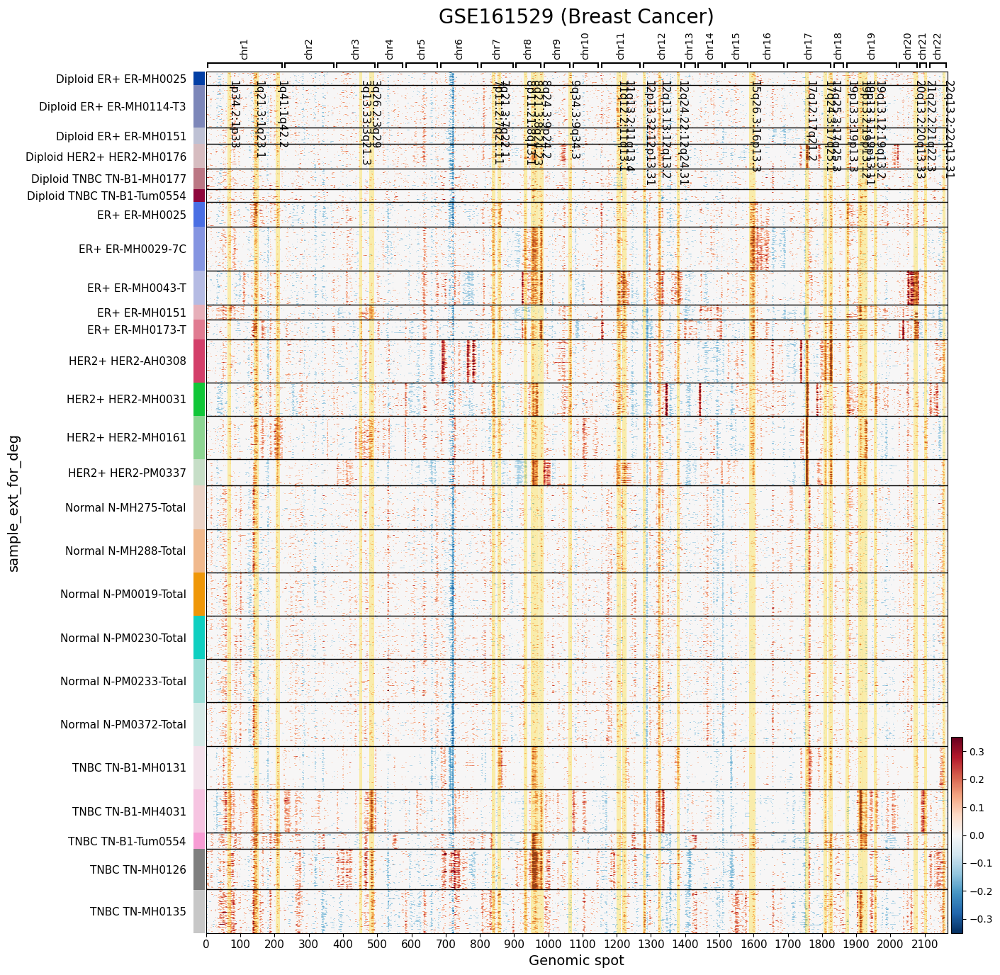

In [6]:
import random

cell_grouping = 'sample_ext_for_deg'
n_max = 400

j = 0
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

axd, _ = plot_cnv( adata_s, groupby = cell_grouping, 
                        N_cells_min = 0.3, N_cells_max = 0.7,
                        title = dataset, title_fs = 20, title_y_pos = 1.05,
                        label_fs = 14, tick_fs = 11, show_cna_spots = True,
                        figsize = (14, 16), swap_axes = False,
                        var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                        cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                        xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center', Ns_min = 4)


N_cells_max: 126, 37 (1233, 1) 
INFO: n_samples_min: 4 -> 4 


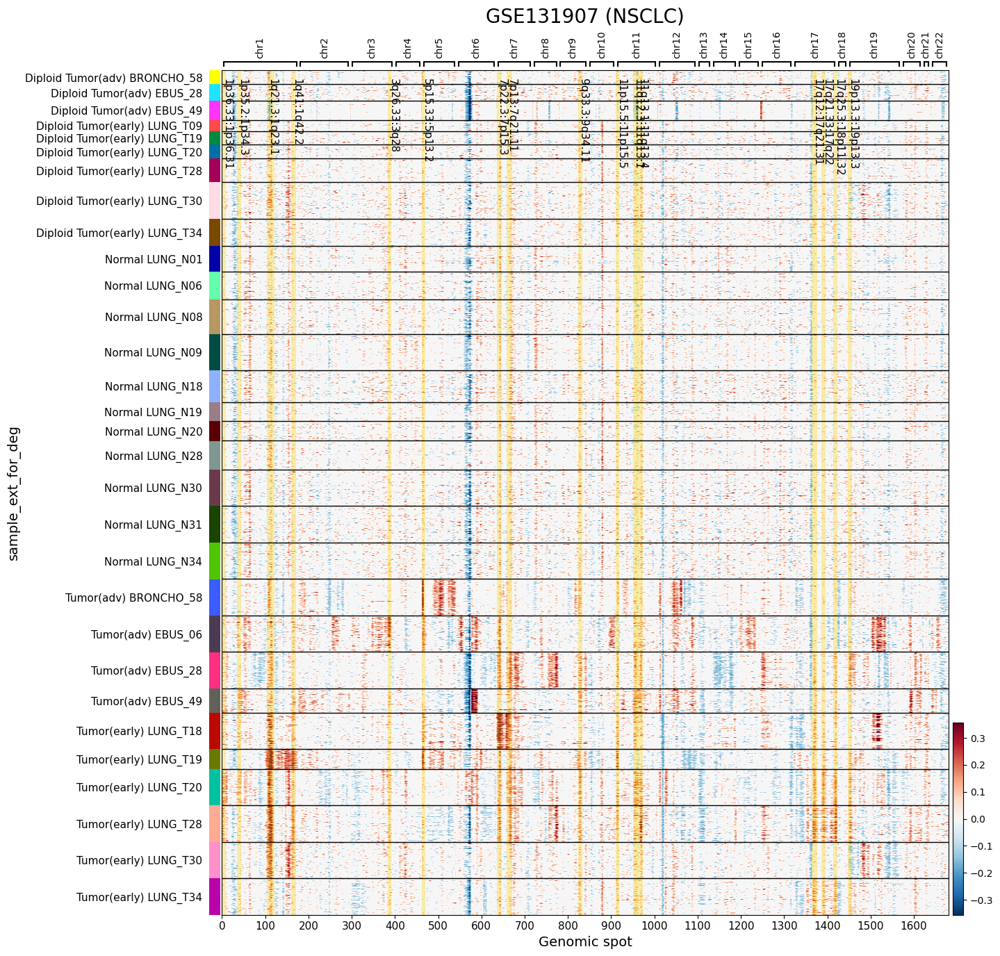

In [7]:
j = 1
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

axd, _ = plot_cnv( adata_s, groupby = cell_grouping, 
                        N_cells_min = 0.3, N_cells_max = 0.7,
                        title = dataset, title_fs = 20, title_y_pos = 1.05,
                        label_fs = 14, tick_fs = 11, show_cna_spots = True,
                        figsize = (14, 16), swap_axes = False,
                        var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                        cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                        xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center', Ns_min = 4)


N_cells_max: 215, 64 (2551, 3) 
INFO: n_samples_min: 4 -> 2 


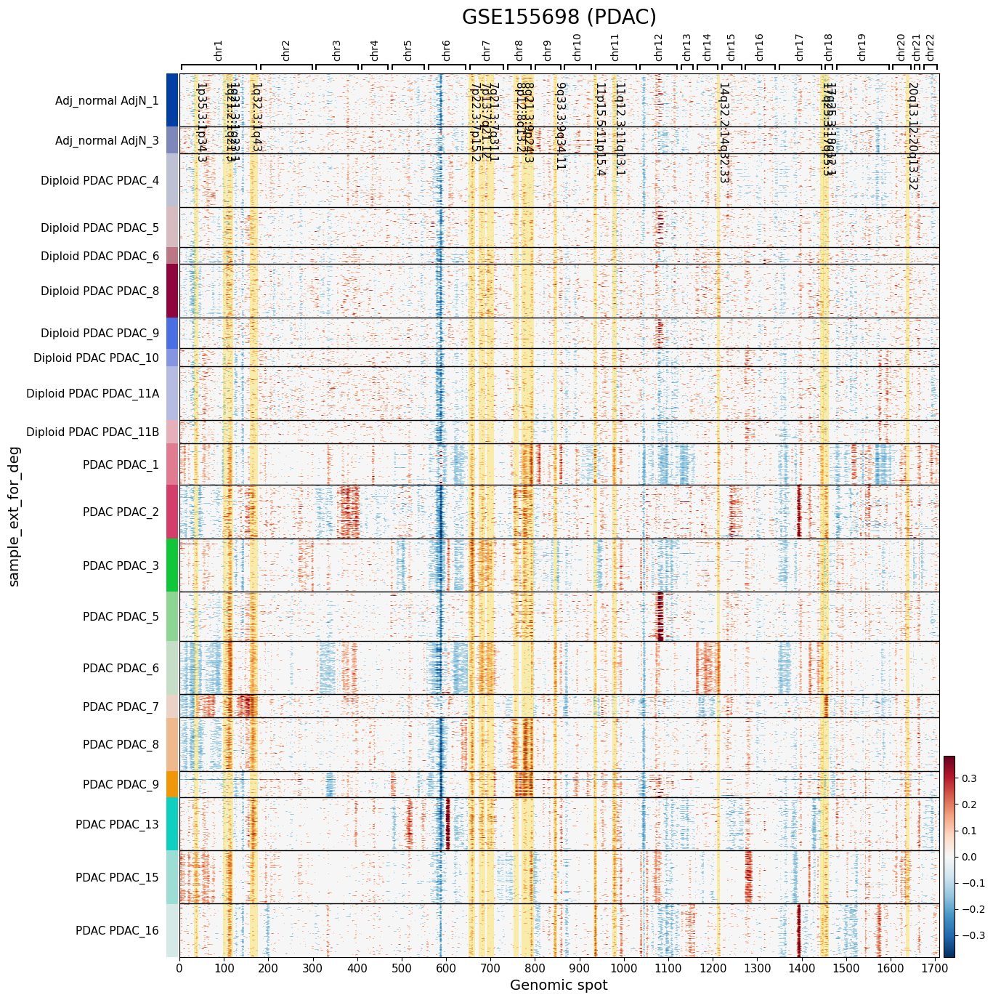

In [8]:
j += 1
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

axd, _ = plot_cnv( adata_s, groupby = cell_grouping, 
                        N_cells_min = 0.3, N_cells_max = 0.7,
                        title = dataset, title_fs = 20, title_y_pos = 1.05,
                        label_fs = 14, tick_fs = 11, show_cna_spots = True,
                        figsize = (14, 16), swap_axes = False,
                        var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                        cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                        xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center', Ns_min = 4)


N_cells_max: 161, 48 (868, 1) 
INFO: n_samples_min: 4 -> 4 


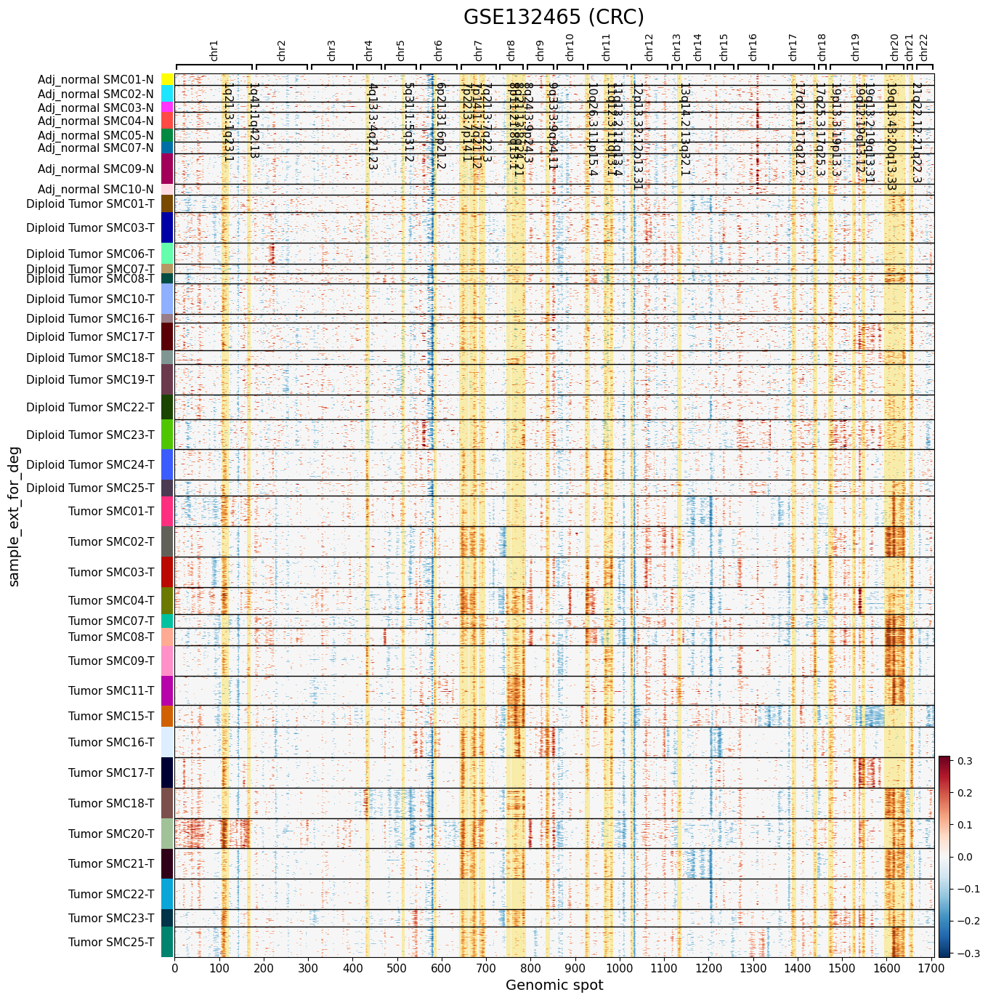

In [9]:
j += 1
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

axd, _ = plot_cnv( adata_s, groupby = cell_grouping, 
                        N_cells_min = 0.3, N_cells_max = 0.7,
                        title = dataset, title_fs = 20, title_y_pos = 1.05,
                        label_fs = 14, tick_fs = 11, show_cna_spots = True,
                        figsize = (14, 16), swap_axes = False,
                        var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                        cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                        xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center', Ns_min = 4)


## __Figure 8__

In [31]:
import random

def get_genomic_spot_containing_gene( gene, dct, known_markers_list = None, verbose = True ):

    bold_blue = "\033[1;34m"  # 1: Bold, 34: Blue
    reset = "\033[0m"

    loc = -1
    s = ''
    for k in dct.keys():
        if gene in list(dct[k]):
            s = ''
            for g in dct[k]:
                if known_markers_list is None:
                    s = s + '%s, ' % g
                elif g in known_markers_list:
                    s = s + '%s%s%s, ' % (bold_blue, g, reset)
                else:
                    s = s + '%s, ' % g
            s = s[:-2]
            if verbose: print( '%12s: %4i - %s' % (gene, k, s))
            loc = k
            break
            
    return loc, s


def get_amp_regions_for_known_markers(adata, spot_llst, known_markers_list):

    plst = []
    rngs_dct = {}
    loc_lst = []
    for j, key in enumerate(spot_llst.keys()):
        lst = spot_llst[key]    
        glst_dct = find_genes_in_genomic_spots(adata, list(lst), spot_ext = 0)
        glst_sel = []
        for g in known_markers_list:
            loc, gene_s = get_genomic_spot_containing_gene( g, glst_dct, known_markers_list, verbose = False )
            if (loc >= 0):
                if loc not in loc_lst:
                    loc_lst.append(loc)
                    print('%15s (%4i-%4i): %6s in %4i - %s' % (key, lst[0], lst[-1], g, loc, gene_s))
                if (key not in plst):
                    plst.append(key)
                glst_sel.append(g)
    
        if len(glst_sel) > 0:
            gs = ''
            for g in glst_sel:
                gs = gs + '%s, ' % g
            rngs_dct[key] = r'%s ($\bf{%s}$)' % (key, gs[:-2])

    return rngs_dct, plst

In [32]:
gmm_ncomp_t = 4 
gmm_ncomp_n = 1
gmm_ncomp_t_per_sample = 2
std_scale = 0.5
t_gain_min = 0.05
n_cells_min = 50
n_samples_min = 4

cell_grouping = 'sample_ext_for_deg'

some_known_markers_list = ['ACOT1', 'ALK', 'BRAF', 'CD82', 'CDH1', 'CDKN2A', 'COPS5', 'CXADR', 
                      'DDHD2', 'ECT2', 'EGFR', 'ERBB2', 'ESR1', 'EIF3E', 'F11R', 
                      'GATA6', 'GSDMD', 'INTS8', 'KRAS', 'LSM1', 'MET', 'NFASC', 'NTRK', 
                      'PLPP2', 'QSOX1', 'RET', 'ROS1', 'SDC1', 'SLC2A1', 'SMAD4', 'SOX2', 
                      'TM9SF2', 'TM9SF3', 'TP53', 'TSPAN15', 'TSPAN6', 'UBAC2' ]

N_cells_max: 239, 50 (971, 1) 
INFO: n_samples_min: 4 -> 4 
  1p34.2:1p32.3 (  61-  75): SLC2A1 in   64 - P3H1, C1orf50, AC098484.3, TMEM269, SVBP, ERMAP, AL512353.1, ZNF691, SLC2A1, SLC2A1-AS1
    3q26.2:3q29 ( 477- 490):   ECT2 in  477 - RPL22L1, EIF5A2, TNIK, AC092919.1, PLD1, FNDC3B, TNFSF10, LINC02068, NCEH1, ECT2
    3q26.2:3q29 ( 477- 490):   SOX2 in  481 - TTC14, AC108734.4, FXR1, DNAJC19, SOX2, ATP11B, AC092953.2, DCUN1D1, MCCC1, LAMP3
 8q21.13:8q24.3 ( 946- 971):  EIF3E in  960 - EIF3E, EMC2, TMEM74, AC104248.1, NUDCD1, ENY2, PKHD1L1, EBAG9, SYBU, CSMD3
 8q21.13:8q24.3 ( 946- 971):  INTS8 in  951 - FSBP, VIRMA, AC023632.2, AC108860.2, ESRP1, DPY19L4, INTS8, CCNE2, AC087752.4, NDUFAF6
  8q24.3:9p24.2 ( 973- 984):  GSDMD in  975 - AC138696.2, TOP1MT, RHPN1-AS1, RHPN1, MAFA-AS1, MAFA, ZC3H3, GSDMD, MROH6, AC067930.3
  9p22.2:9p13.3 ( 990- 995): CDKN2A in  992 - KLHL9, IFNE, MTAP, AL359922.2, CDKN2A, CDKN2B-AS1, CDKN2B, AL157937.1, DMRTA1, LINC01239
  17q12:17q21.2 (1750-1761):  

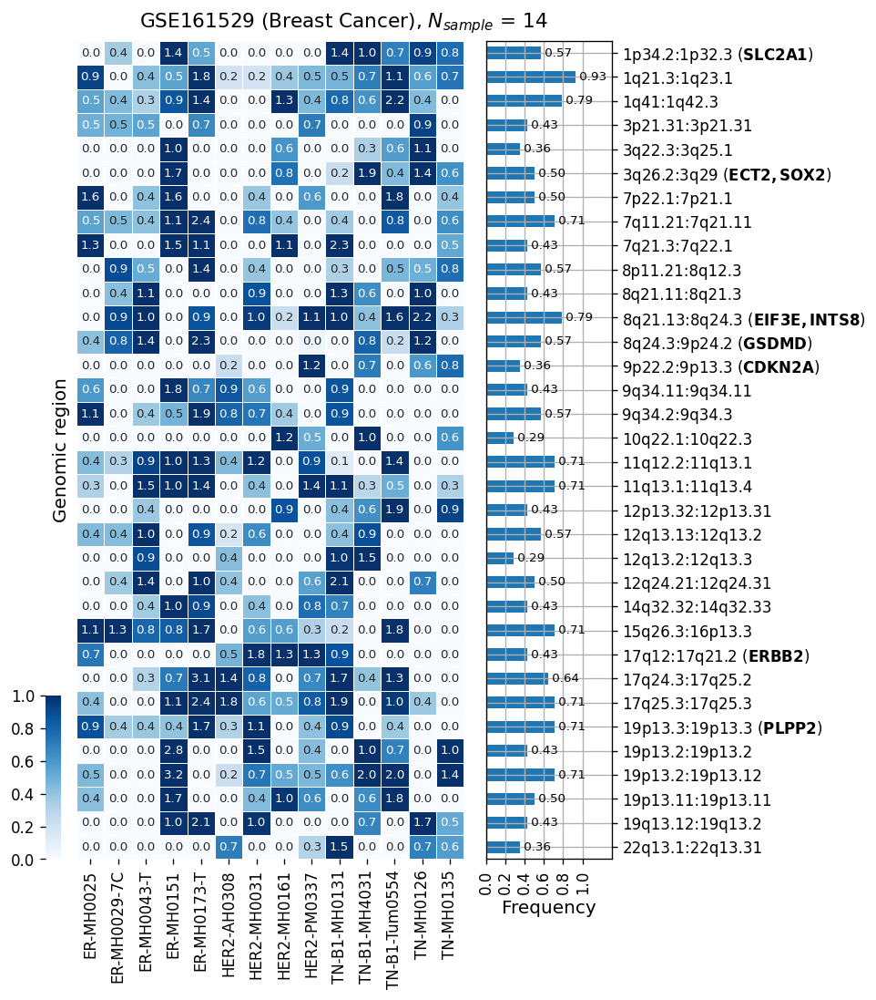

In [39]:
j = 0
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

results = find_signif_CNV_gain_regions( adata_s, groupby = cell_grouping, 
                                        N_cells_min = 50, N_cells_max = 0.5,
                                        gmm_ncomp_t = gmm_ncomp_t, gmm_ncomp_n = gmm_ncomp_n, 
                                        gmm_ncomp_t_per_sample = gmm_ncomp_t_per_sample, 
                                        std_scale = std_scale, t_gain_min = t_gain_min, 
                                        n_samples_min = n_samples_min, med_filter_len = 3 )

spot_llst = results['spots']
df = results['cnv_peaks_pos']

rngs_dct, plst = get_amp_regions_for_known_markers(adata_s, spot_llst, some_known_markers_list)
df.rename(columns = rngs_dct, inplace = True)

title = '%s, $N_{sample}$ = %i' % (dataset, df.shape[0])
axes = plot_cnv_hit( df, title = title, title_fs = 13, label_fs = 12, tick_fs = 10, 
                     wspace = 0.1, dpi = 120, ylabel = 'Genomic region', bin_size = 0.22, cmap = 'Blues')

  1p34.2:1p32.3 (  64-  77): SLC2A1 in   64 - P3H1, C1orf50, AC098484.3, TMEM269, SVBP, ERMAP, AL512353.1, ZNF691, SLC2A1, SLC2A1-AS1
    3q26.2:3q29 ( 475- 490):   ECT2 in  477 - RPL22L1, EIF5A2, TNIK, AC092919.1, PLD1, FNDC3B, TNFSF10, LINC02068, NCEH1, ECT2
    3q26.2:3q29 ( 475- 490):   SOX2 in  481 - TTC14, AC108734.4, FXR1, DNAJC19, SOX2, ATP11B, AC092953.2, DCUN1D1, MCCC1, LAMP3
 8q21.13:8q24.3 ( 945- 971):  EIF3E in  960 - EIF3E, EMC2, TMEM74, AC104248.1, NUDCD1, ENY2, PKHD1L1, EBAG9, SYBU, CSMD3
 8q21.13:8q24.3 ( 945- 971):  INTS8 in  951 - FSBP, VIRMA, AC023632.2, AC108860.2, ESRP1, DPY19L4, INTS8, CCNE2, AC087752.4, NDUFAF6
  8q24.3:9p24.2 ( 973- 984):  GSDMD in  975 - AC138696.2, TOP1MT, RHPN1-AS1, RHPN1, MAFA-AS1, MAFA, ZC3H3, GSDMD, MROH6, AC067930.3
  9p22.2:9p13.3 ( 990- 995): CDKN2A in  992 - KLHL9, IFNE, MTAP, AL359922.2, CDKN2A, CDKN2B-AS1, CDKN2B, AL157937.1, DMRTA1, LINC01239
  17q12:17q21.2 (1750-1759):  ERBB2 in 1755 - TCAP, PNMT, PGAP3, ERBB2, MIEN1, GRB7, IKZF3

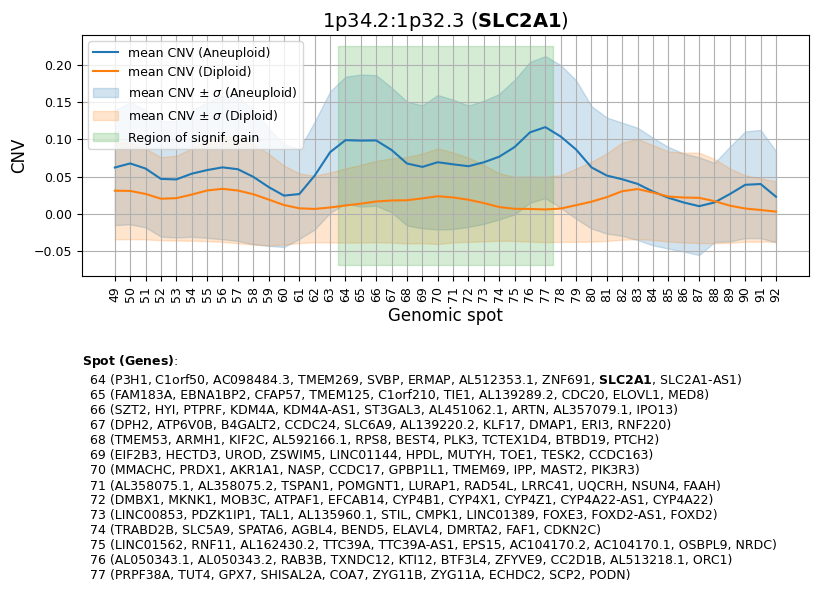

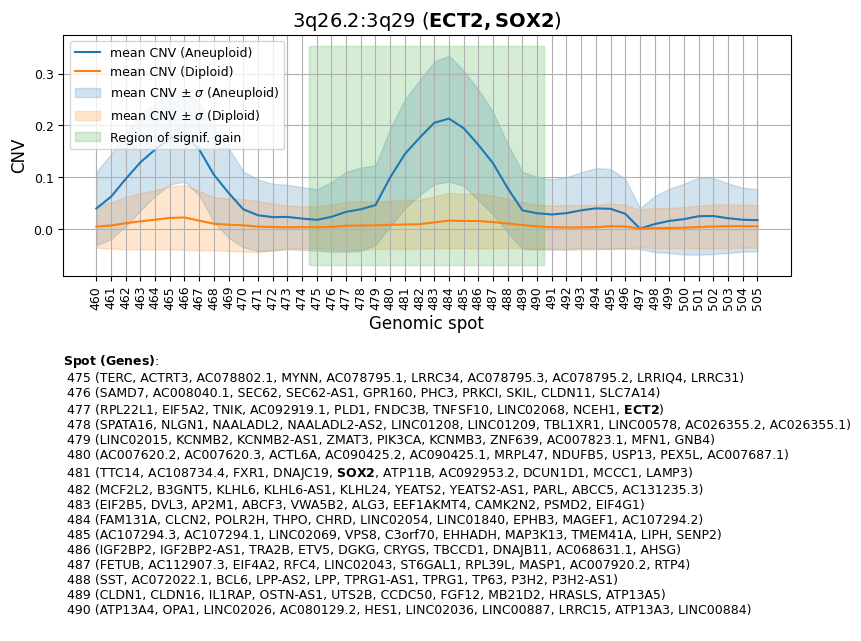

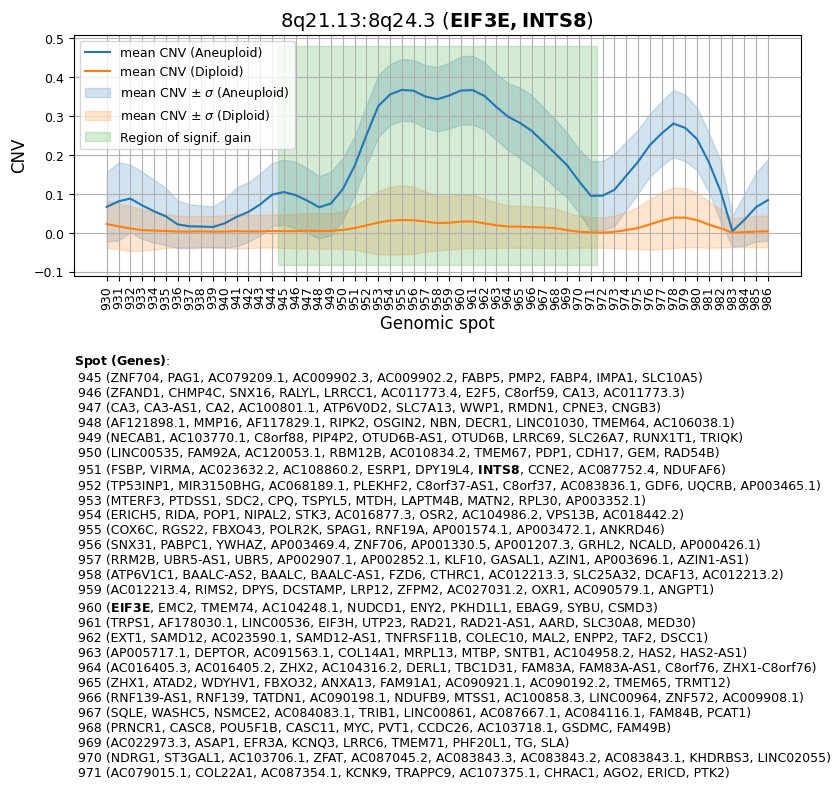

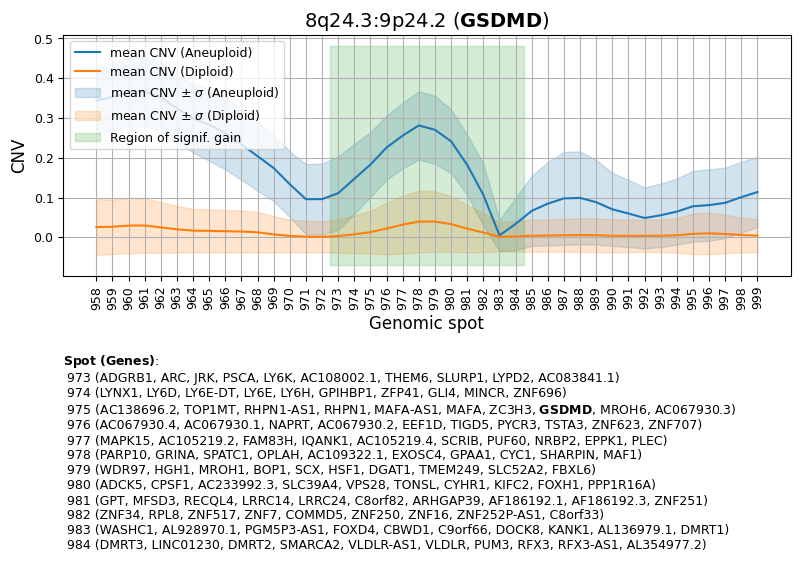

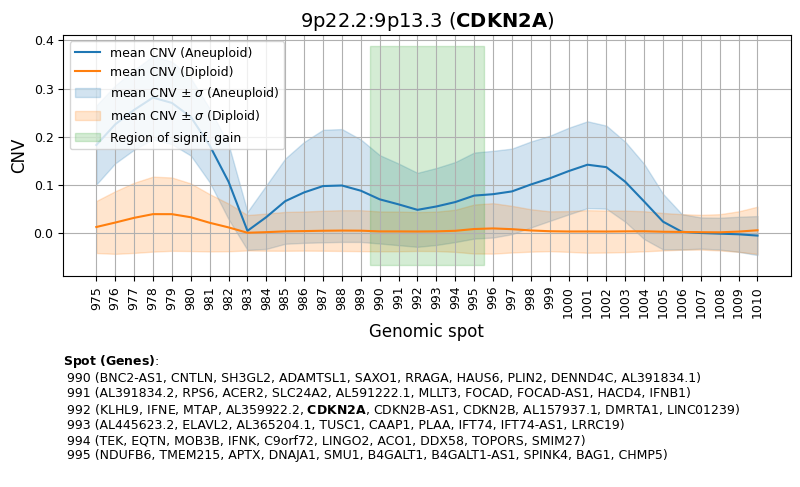

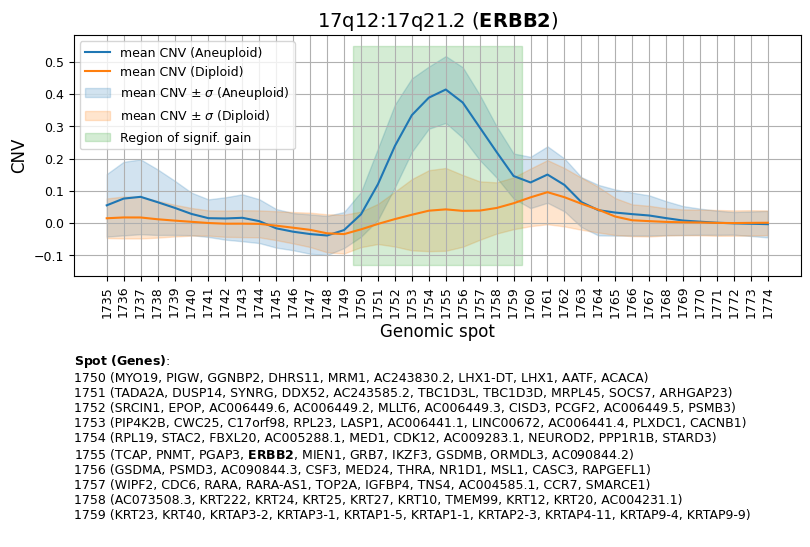

In [34]:
gmm_tumor =  results['gmm (Aneuploid)']
gmm_normal = results['gmm (Diploid)']
spot_llst = results['spots']
rngs_dct, plst = get_amp_regions_for_known_markers(adata_s, spot_llst, some_known_markers_list)

if len(plst) > 0:

    for p in plst:
        x_lower = spot_llst[p][0]
        x_upper = spot_llst[p][-1]
        
        plot_cnv_stat( adata_s, x_lower, x_upper, gmm_tumor, gmm_normal, title = rngs_dct[p],
                       title_fs = 14, label_fs = 12, legend_fs = 9,
                       tick_fs = 9, xtick_rot = 90, xtick_ha = 'center', 
                       std_scale = 1, figsize = (8,3), ax = None, cmap_name = 'tab10', 
                       grid = True, text_pos_adj = 0.4, rng_ext = 15, 
                       known_markers_list = some_known_markers_list )

N_cells_max: 82, 50 (1233, 1) 
INFO: n_samples_min: 4 -> 4 
   3q26.33:3q28 ( 384- 390):   SOX2 in  385 - ATP11B, B3GNT5, DCUN1D1, DNAJC19, KLHL6, KLHL6-AS1, LAMP3, MCCC1, MCF2L2, SOX2
   7p13:7q21.12 ( 656- 671):   EGFR in  661 - CCT6A, EGFR, LANCL2, MRPS17, PSPH, SEC61G, SEPT14, SUMF2, VOPP1, ZNF713
  8q24.3:8q24.3 ( 770- 776):  GSDMD in  771 - GSDMD, MAFA, MAFA-AS1, MROH6, NAPRT, RHPN1, RHPN1-AS1, TOP1MT, ZC3H3, ZNF696
  17q12:17q21.2 (1365-1374):  ERBB2 in 1366 - ERBB2, GRB7, GSDMB, IKZF3, MIEN1, PGAP3, PNMT, PPP1R1B, STARD3, TCAP
19p13.3:19p13.3 (1447-1456):  PLPP2 in 1447 - C2CD4C, CDC34, GZMM, MADCAM1, MIER2, ODF3L2, PLPP2, SHC2, THEG, TPGS1


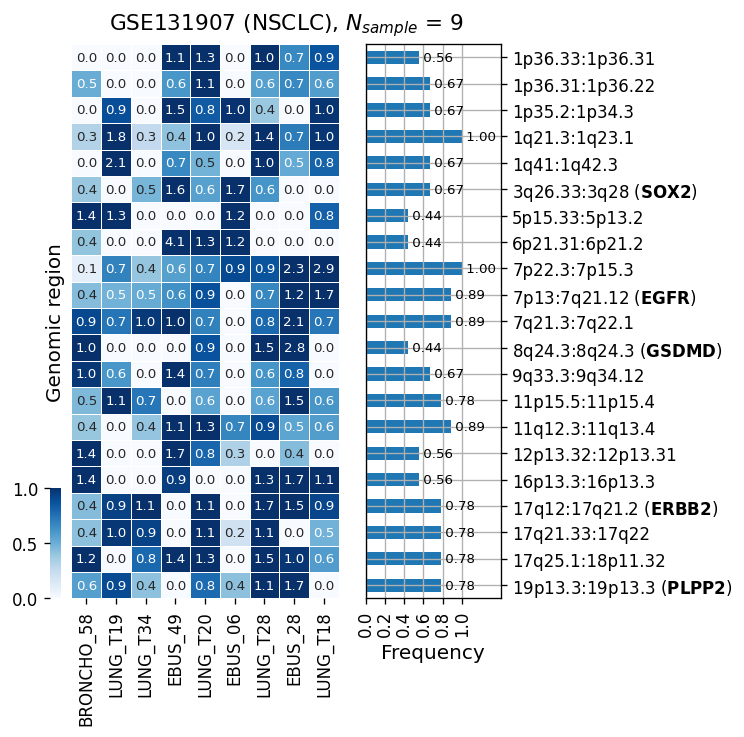

In [40]:
j += 1
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

results = find_signif_CNV_gain_regions( adata_s, groupby = cell_grouping, 
                                        N_cells_min = 50, N_cells_max = 0.5,
                                        gmm_ncomp_t = gmm_ncomp_t, gmm_ncomp_n = gmm_ncomp_n, 
                                        gmm_ncomp_t_per_sample = gmm_ncomp_t_per_sample, 
                                        std_scale = std_scale, t_gain_min = t_gain_min, 
                                        n_samples_min = n_samples_min, med_filter_len = 3 )

spot_llst = results['spots']
df = results['cnv_peaks_pos']

rngs_dct, plst = get_amp_regions_for_known_markers(adata, spot_llst, some_known_markers_list)
df.rename(columns = rngs_dct, inplace = True)

title = '%s, $N_{sample}$ = %i' % (dataset, df.shape[0])
axes = plot_cnv_hit( df, title = title, title_fs = 13, label_fs = 12, tick_fs = 10, 
                     wspace = 0.1, dpi = 120, ylabel = 'Genomic region', bin_size = 0.22, cmap = 'Blues')

   3q26.33:3q28 ( 384- 390):   SOX2 in  385 - ATP11B, B3GNT5, DCUN1D1, DNAJC19, KLHL6, KLHL6-AS1, LAMP3, MCCC1, MCF2L2, SOX2
   7p13:7q21.12 ( 656- 671):   EGFR in  661 - CCT6A, EGFR, LANCL2, MRPS17, PSPH, SEC61G, SEPT14, SUMF2, VOPP1, ZNF713
  8q24.3:8q24.3 ( 770- 776):  GSDMD in  771 - GSDMD, MAFA, MAFA-AS1, MROH6, NAPRT, RHPN1, RHPN1-AS1, TOP1MT, ZC3H3, ZNF696
  17q12:17q21.2 (1365-1374):  ERBB2 in 1366 - ERBB2, GRB7, GSDMB, IKZF3, MIEN1, PGAP3, PNMT, PPP1R1B, STARD3, TCAP
19p13.3:19p13.3 (1447-1456):  PLPP2 in 1447 - C2CD4C, CDC34, GZMM, MADCAM1, MIER2, ODF3L2, PLPP2, SHC2, THEG, TPGS1


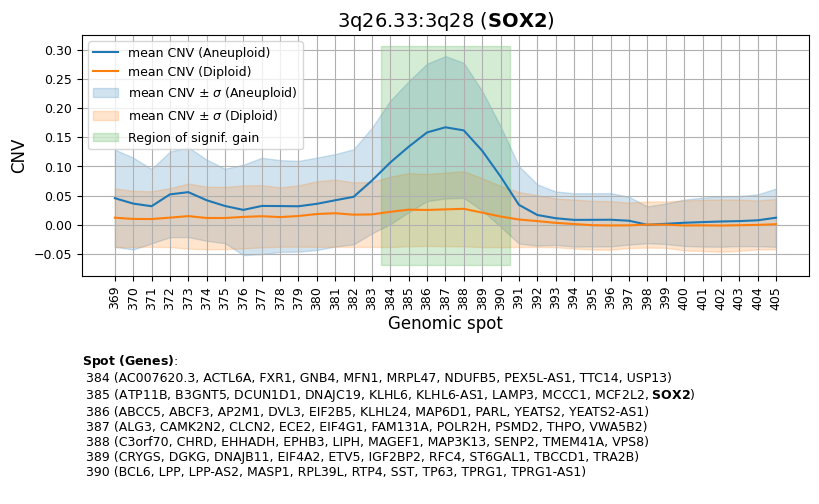

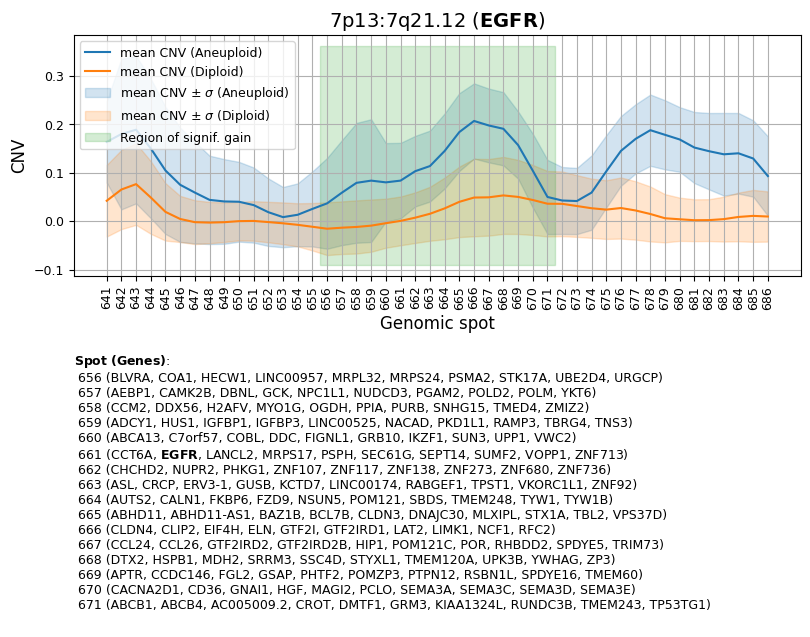

In [42]:
gmm_tumor =  results['gmm (Aneuploid)']
gmm_normal = results['gmm (Diploid)']
spot_llst = results['spots']
rngs_dct, plst = get_amp_regions_for_known_markers(adata_s, spot_llst, some_known_markers_list)

if len(plst) > 0:

    for p in plst[:2]:
        x_lower = spot_llst[p][0]
        x_upper = spot_llst[p][-1]
        
        plot_cnv_stat( adata_s, x_lower, x_upper, gmm_tumor, gmm_normal, title = rngs_dct[p],
                       title_fs = 14, label_fs = 12, legend_fs = 9,
                       tick_fs = 9, xtick_rot = 90, xtick_ha = 'center', 
                       std_scale = 1, figsize = (8,3), ax = None, cmap_name = 'tab10', 
                       grid = True, text_pos_adj = 0.4, rng_ext = 15, 
                       known_markers_list = some_known_markers_list )

N_cells_max: 95, 50 (2551, 3) 
INFO: n_samples_min: 4 -> 2 
    1q32.1:1q43 ( 146- 173):  NFASC in  152 - LRRN2, NFASC, CNTN2, TMEM81, RBBP5, DSTYK, TMCC2, NUAK2, KLHDC8A, LEMD1-AS1
8p11.23:8q21.11 ( 752- 763):  COPS5 in  762 - C8orf44, MCMDC2, TCF24, PPP1R42, COPS5, CSPP1, ARFGEF1, CPA6, PREX2, C8orf34
8p11.23:8q21.11 ( 752- 763):  DDHD2 in  752 - LSM1, BAG4, DDHD2, LETM2, FGFR1, TACC1, PLEKHA2, HTRA4, TM2D2, ADAM9
  8q21.3:9p24.3 ( 769- 796):  EIF3E in  777 - DCSTAMP, LRP12, ZFPM2, OXR1, ABRA, ANGPT1, RSPO2, EIF3E, EMC2, TMEM74
  8q21.3:9p24.3 ( 769- 796):  GSDMD in  790 - ZC3H3, GSDMD, MROH6, EEF1D, TIGD5, TSTA3, ZNF623, ZNF707, MAPK15, FAM83H
  8q21.3:9p24.3 ( 769- 796):  INTS8 in  772 - ESRP1, DPY19L4, INTS8, CCNE2, NDUFAF6, TP53INP1, MIR3150A, PLEKHF2, C8orf37, GDF6
12p13.2:12p12.1 (1048-1054):   KRAS in 1054 - ETNK1, SOX5, BCAT1, AC026310.1, C12orf77, LRMP, CASC1, KRAS, RASSF8-AS1, RASSF8
18p11.32:18q12.1 (1449-1459):  GATA6 in 1456 - ABHD3, MIB1, MIR1-2, GATA6-AS1, GATA6, CTAGE

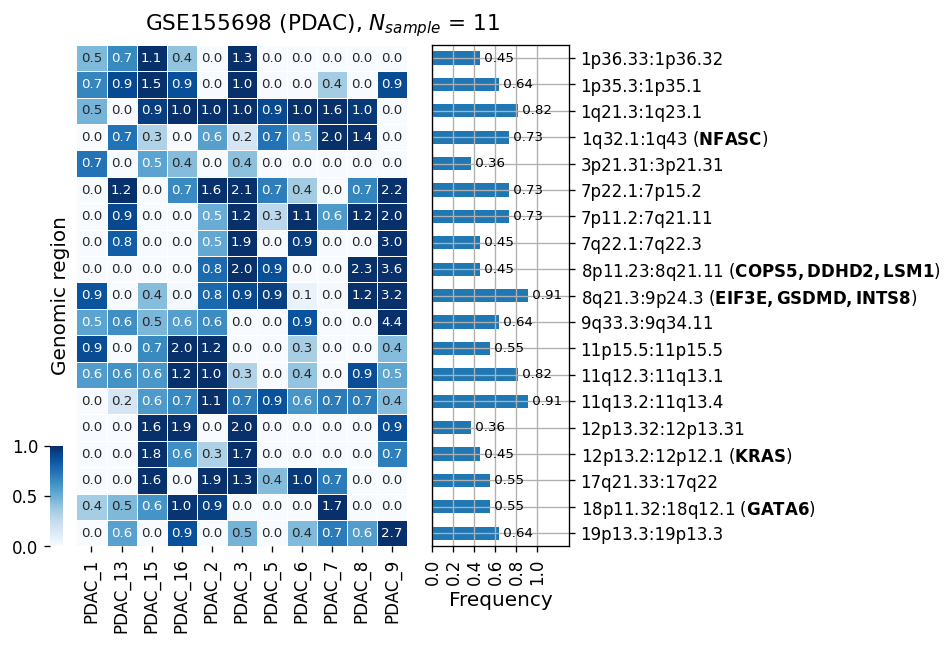

In [36]:
j = 2
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

results = find_signif_CNV_gain_regions( adata_s, groupby = cell_grouping, 
                                        N_cells_min = 50, N_cells_max = 0.5,
                                        gmm_ncomp_t = gmm_ncomp_t, gmm_ncomp_n = gmm_ncomp_n, 
                                        gmm_ncomp_t_per_sample = gmm_ncomp_t_per_sample, 
                                        std_scale = std_scale, t_gain_min = t_gain_min, 
                                        n_samples_min = n_samples_min, med_filter_len = 3, N_spots_min = 14 )

spot_llst = results['spots']
df = results['cnv_peaks_pos']

rngs_dct, plst = get_amp_regions_for_known_markers(adata, spot_llst, some_known_markers_list)
df.rename(columns = rngs_dct, inplace = True)

title = '%s, $N_{sample}$ = %i' % (dataset, df.shape[0])
axes = plot_cnv_hit( df, title = title, title_fs = 13, label_fs = 12, tick_fs = 10, 
                     wspace = 0.1, dpi = 120, ylabel = 'Genomic region', bin_size = 0.22, cmap = 'Blues')

N_cells_max: 87, 50 (868, 1) 
INFO: n_samples_min: 4 -> 4 
 7p14.1:7q11.23 ( 662- 677):   EGFR in  668 - COBL, EGFR, EGFR-AS1, GRB10, LANCL2, MRPS17, SEC61G, VOPP1, VSTM2A, ZNF713
 8q21.2:8q24.22 ( 759- 777):  EIF3E in  769 - ANGPT1, EBAG9, EIF3E, EMC2, ENY2, NUDCD1, PKHD1L1, RSPO2, SYBU, TMEM74
 8q21.2:8q24.22 ( 759- 777):  INTS8 in  763 - C8orf37, C8orf37-AS1, CCNE2, DPY19L4, GDF6, INTS8, NDUFAF6, PLEKHF2, TP53INP1
  8q24.3:9p24.3 ( 779- 788):  GSDMD in  781 - GSDMD, MAFA, MINCR, MROH6, NAPRT, RHPN1, RHPN1-AS1, TOP1MT, ZC3H3, ZNF696


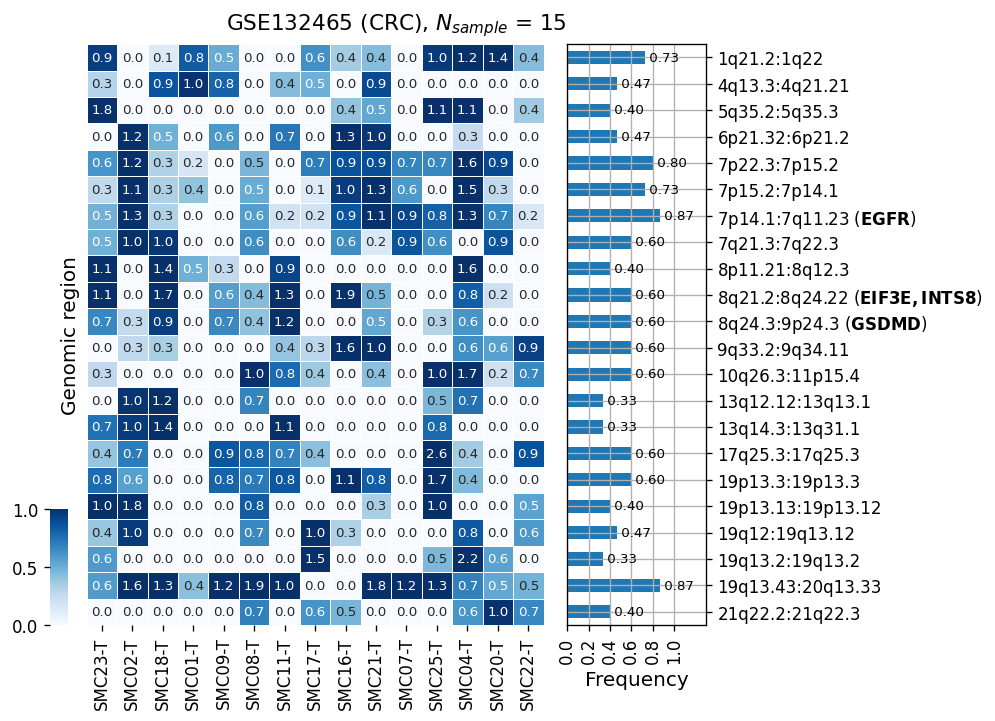

In [37]:
j = 3
dataset = datasets[j]
adata = adata_t[dataset]

b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

results = find_signif_CNV_gain_regions( adata_s, groupby = cell_grouping, 
                                        N_cells_min = 50, N_cells_max = 0.5,
                                        gmm_ncomp_t = gmm_ncomp_t, gmm_ncomp_n = gmm_ncomp_n, 
                                        gmm_ncomp_t_per_sample = gmm_ncomp_t_per_sample, 
                                        std_scale = std_scale, t_gain_min = t_gain_min, 
                                        n_samples_min = n_samples_min, med_filter_len = 3, N_spots_min = 10 )

spot_llst = results['spots']
df = results['cnv_peaks_pos']

rngs_dct, plst = get_amp_regions_for_known_markers(adata, spot_llst, some_known_markers_list)
df.rename(columns = rngs_dct, inplace = True)

title = '%s, $N_{sample}$ = %i' % (dataset, df.shape[0])
axes = plot_cnv_hit( df, title = title, title_fs = 13, label_fs = 12, tick_fs = 10, 
                     wspace = 0.1, dpi = 120, ylabel = 'Genomic region', bin_size = 0.22, cmap = 'Blues')

### __Supplemental figure: Cell-type marker expression profiles__

Num markers selected: 172 -> 120


... storing 'celltype_subset' as categorical


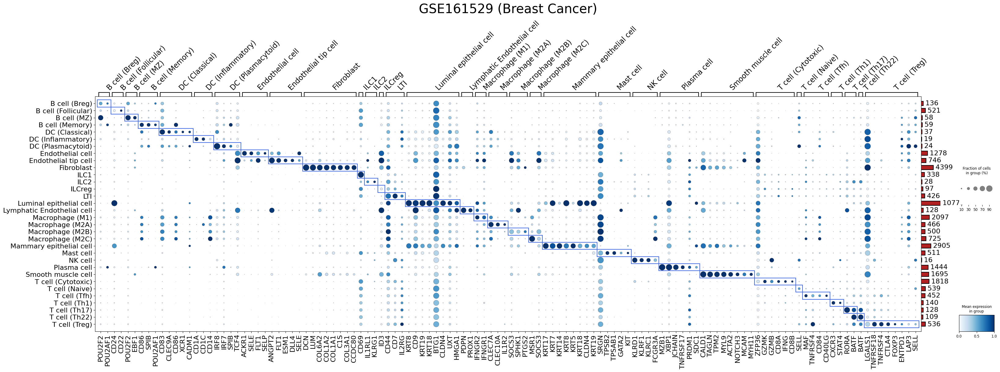

Num markers selected: 189 -> 120


... storing 'celltype_subset' as categorical


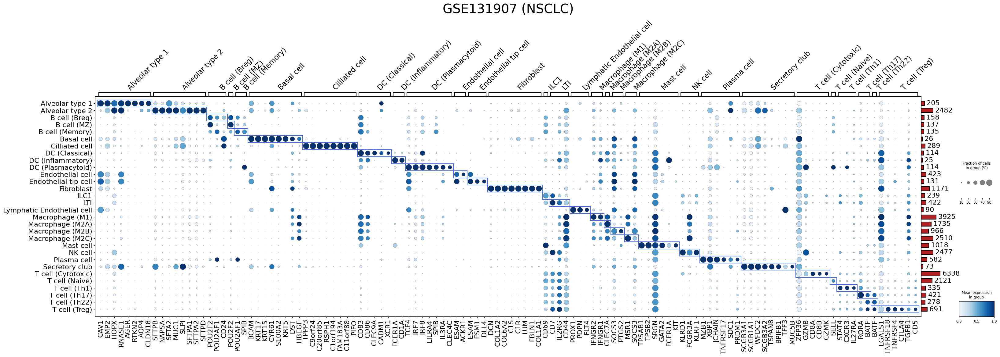

Num markers selected: 175 -> 120


... storing 'celltype_subset' as categorical


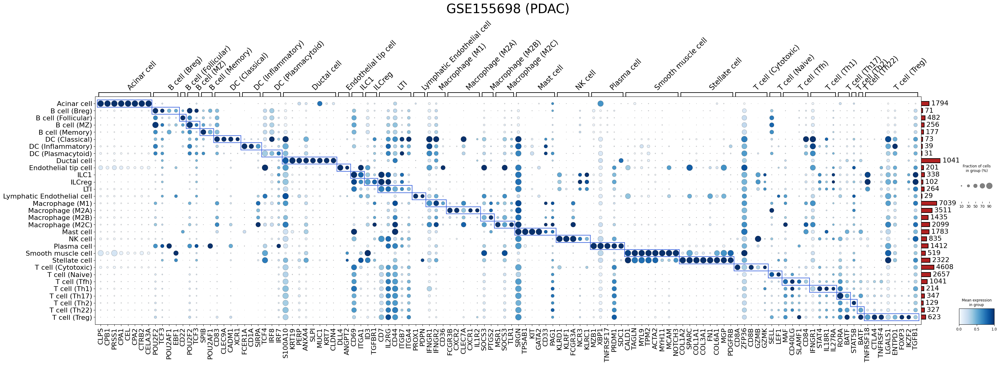

Num markers selected: 192 -> 120


... storing 'celltype_subset' as categorical


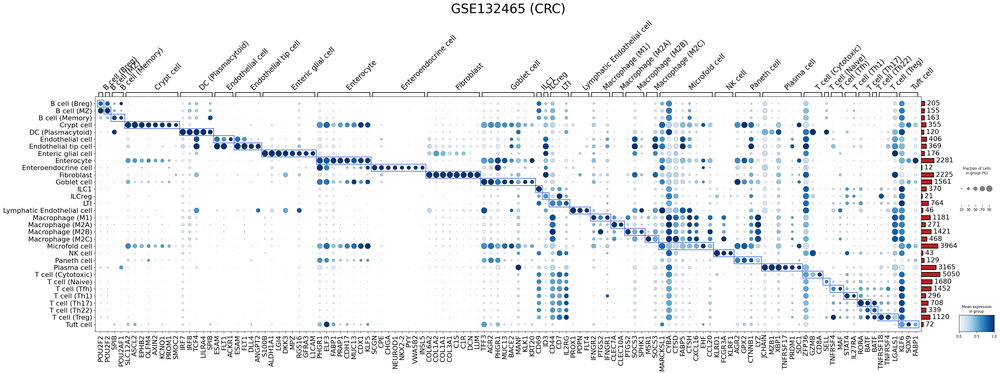

In [23]:
for j, dataset in enumerate(datasets):

    adata = adata_t[dataset]
    
    b = adata.obs['tumor_origin_ind']
    adata_s = adata[b,:]
    
    cell_grouping = 'sample_ext_for_deg'
    
    ## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
    plot_marker_exp(  adata, markers = None,
                  N_cells_per_group_min = 10, N_markers_per_group_max = 8, N_markers_total = 120,
                  title = dataset, title_y_pos = 11, title_fs = 30,
                  text_fs = 16, standard_scale = 'var',
                  var_group_rotation = 45, var_group_height = 1.2,
                  nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                  rem_mkrs_common_in_N_groups_or_more = 3,
                  figsize = None, swap_ax = False, legend = True,
                  cmap = 'Blues', linewidth = 1.5, linecolor = 'royalblue')